In [1]:
from boututils.datafile import DataFile
from boutdata.collect import collect
from boutdata.data import BoutData
import os, sys
import matplotlib
# matplotlib.use('Qt5Agg',force=True)
# matplotlib.use("TKAgg",force=True)
# matplotlib.use("widget",force=True)
import matplotlib.pyplot as plt
import xbout
import pandas as pd
import numpy as np
import pickle as pkl
import xarray as xr
import boutdata

from boutdata.restart import addvar
import glob
import shutil

import scipy

sys.path.append(r"C:\Users\mikek\OneDrive\Project\python-packages\sdtools")


from hermes3.case_db import *
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *
from hermes3.utils import *
from cli.cmonitor import *
# from code_comparison.code_comparison import *


%load_ext autoreload
%autoreload 2

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# IO

In [2]:
db = CaseDB(
    # case_dir = r"/ssd_scratch/hcases",
    # grid_dir = r"/ssd_scratch/hcases"
    )

toload = [ 
    
    # dict(name="asymp2", id="faf7c-legcond_asymp2", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="asymp2_noradrec", id="faf10a-legcond_asymp2_noradrec", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    # dict(name="base", id="faf6a-newbase_faf5y1_tightrtol", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="asymp2", id="faf7c-legcond_asymp2", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun1_late", id="faf7d-rerun", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun2_latest", id="faf7d-rerun2-latest_commit", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun3_04fb258", id="faf7d-rerun3-restartfaf7d_04fb258", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun4_5f7b025", id="faf7d-rerun4-5f7b025", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun5_latest_revertall", id="faf7d-rerun5-latest_revertall", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun6_latest_revertPnNVn", id="faf7d-rerun6-latest_revertPnNVn", unnormalise_geom = True, use_xhermes = True, squash = False),
    # dict(name="rerun7_latest_revertCondNVn", id="faf7d-rerun7-latest_revertCondNVn", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun8_latest_revertNVn", id="faf7d-rerun8-latest_revertNVn", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun10_latest_again", id="faf7d-rerun10-latest_again", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="rerun4_5f7b025", id="faf7d-rerun4-5f7b025", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="noupwind", id="faf7e-legcond_asymp2_long_noupwind", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="pvodediags", id="faf7f-legcond_asymp2_long_pvodediagsbranch", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    # dict(name="rerun10_latest_again", id="faf7d-rerun10-latest_again", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="pvodediags", id="faf7f-legcond_asymp2_long_pvodediagsbranch", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    # dict(name="base", id="faf6a-newbase_faf5y1_tightrtol", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="base_viking", id="faf6f-newbase_faf5y1_tightrtol_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test", id="faf7d-rerun10-latest_again", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_viking", id="faf7d-legcond_asymp2_long_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    
    # dict(name="base", id="faf6gb-base_alpha_1.0_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_alpha_0.5", id="faf7gb-alpha_0.5_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_alpha_1.0", id="faf7ga-alpha_1.0_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_alpha_1.5", id="faf7gc-alpha_1.5_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_alpha_2.0", id="faf7gd-alpha_2.0_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_alpha_2.5", id="faf7ge-alpha_2.5_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    # dict(name="base_unlim", id="faf6gd-base_DnKnUnlim_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_unlim", id="faf7gf-DnKnUnlim_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    # dict(name="base", id="faf6gb-base_alpha_1.0_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="base_xonly_cond", id="faf6h-base_cond_xonly_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test", id="faf7ga-alpha_1.0_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    # dict(name="test_xonly_cond", id="faf7j-legcond_asymp2_long_cond_xonly_v", unnormalise_geom = True, use_xhermes = True, squash = False), 
    
    dict(name="original_braginskiifix_newmaster", id="d42a-d40db_mfp1_braginskiifix_newmaster", unnormalise_geom = True, use_xhermes = True, squash = True), 
    dict(name="new", id="d43a-d40db_afn_neutral_limiters", unnormalise_geom = True, use_xhermes = True, squash = True), 
    dict(name="new_xonly", id="d43b-cond_xonly", unnormalise_geom = True, use_xhermes = True, squash = True), 
    
]
cs = {}
for case in toload:
    cs[case["name"]] = db.load_case_2D(case["id"], use_squash = case["squash"], verbose = True)


- Reading case d42a-d40db_mfp1_braginskiifix_newmaster
-----------------------
- Looking for squash file
- Squash file found. squash date 09/03/2024, 10:47:52, dmp file date 09/03/2024, 10:39:56

Unnormalising with xHermes
- Reading case d43a-d40db_afn_neutral_limiters
-----------------------
- Looking for squash file
- Squash file found. squash date 08/13/2024, 16:00:07, dmp file date 08/13/2024, 15:04:47

Unnormalising with xHermes
- Reading case d43b-cond_xonly
-----------------------
- Looking for squash file
- Squash file found. squash date 08/13/2024, 16:00:46, dmp file date 08/13/2024, 14:31:10

Unnormalising with xHermes


In [11]:
ds["kappa_n_d"].isel(x = 10, theta = 40).values

array(4.59224301e+19)

In [21]:
data.shape

(1, 20, 58, 1)

# Plots of fluxes

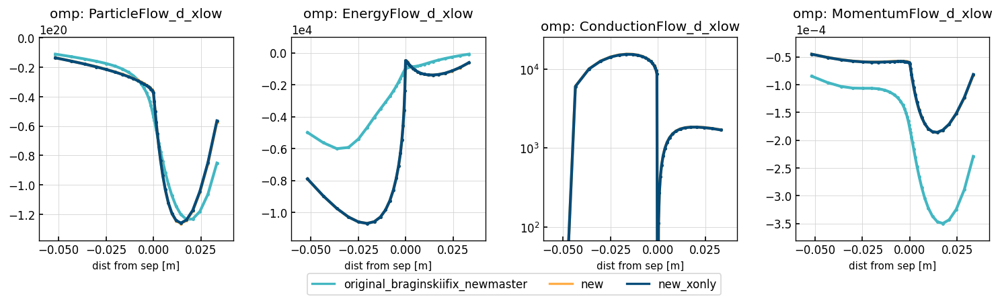

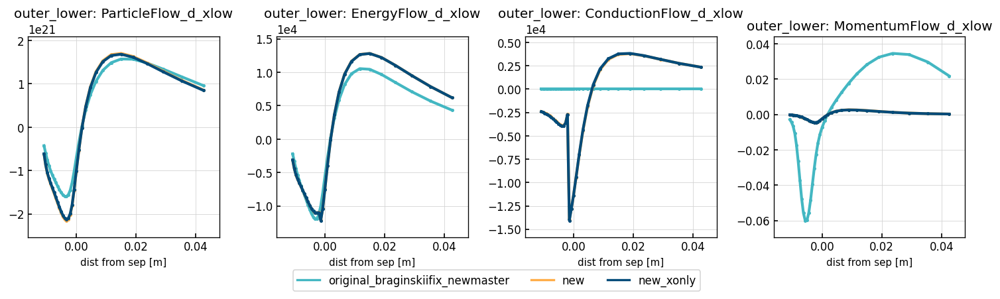

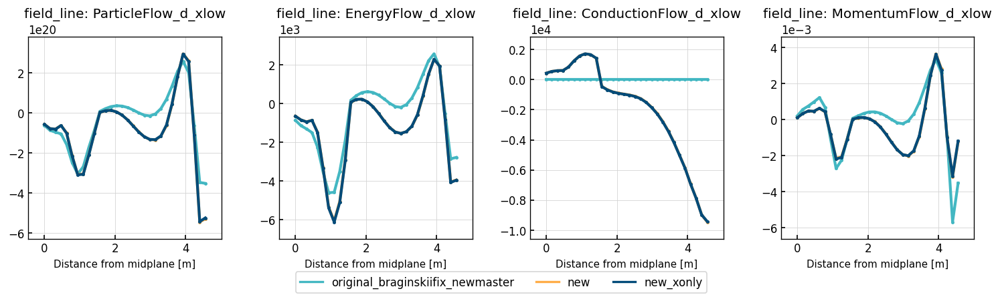

In [3]:
toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))
    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["ParticleFlow_d_xlow", "EnergyFlow_d_xlow", "ConductionFlow_d_xlow", "MomentumFlow_d_xlow"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)

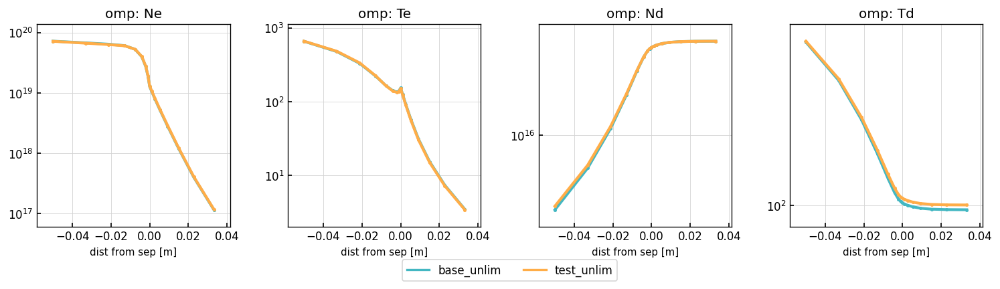

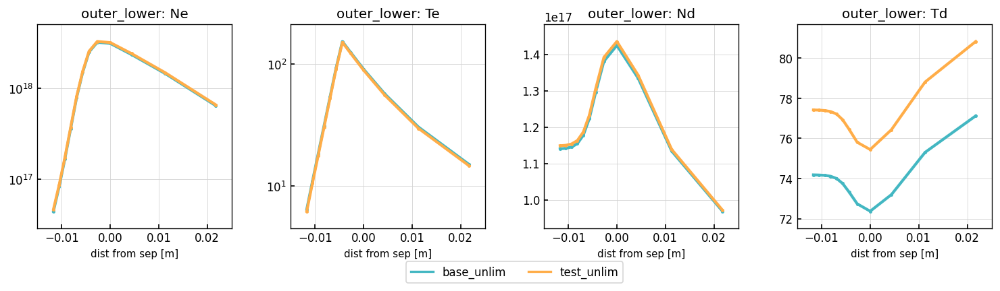

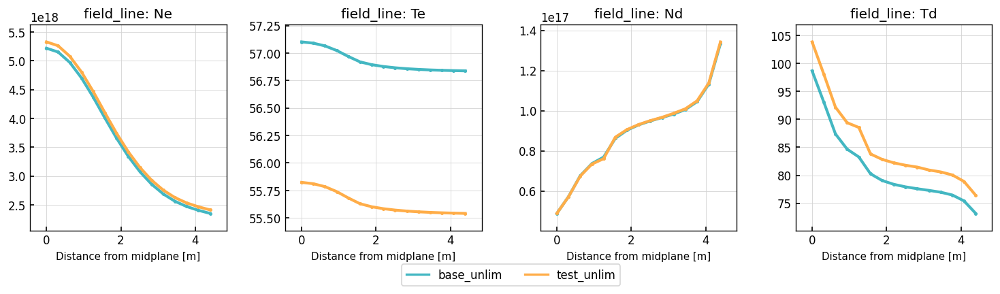

In [5]:
toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))
    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["Ne", "Te", "Nd", "Td"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)

# TImescales

In [3]:
cs.keys()

dict_keys(['original_braginskiifix_newmaster', 'new', 'new_xonly'])

In [ ]:
# G = flux m^-2 s^-1
# v = velocity m/s
# R = rate s^-1
# L = length m
# G = v * Ne
# v = G / Ne
# G = R / da
# tau = v / L
# so tau = R / (da * Ne * L)

original_braginskiifix_newmaster

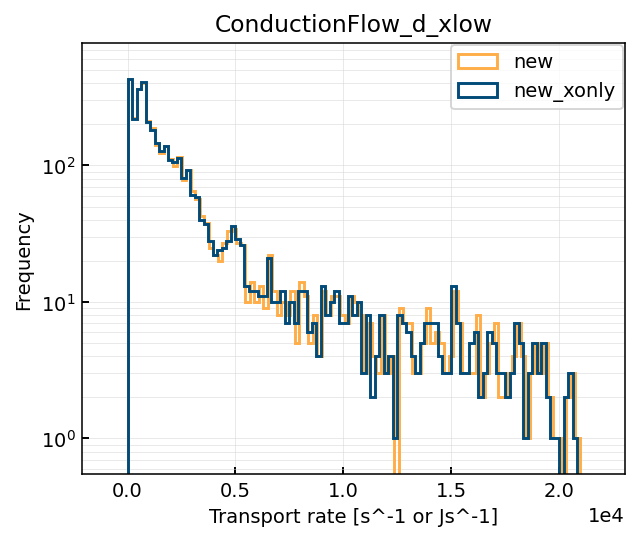

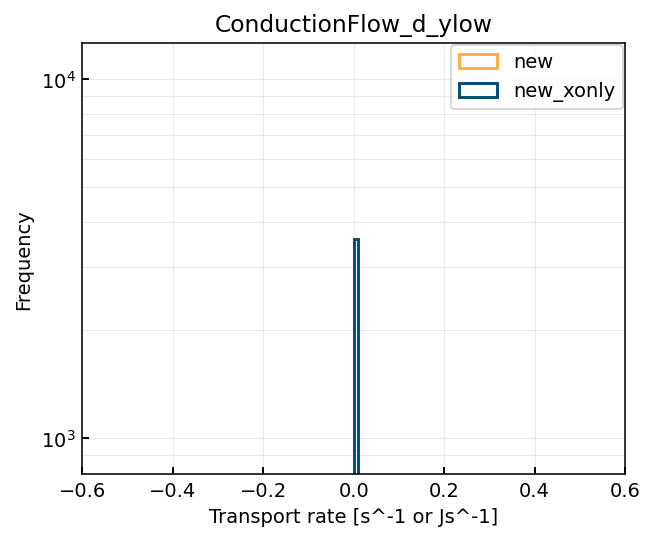

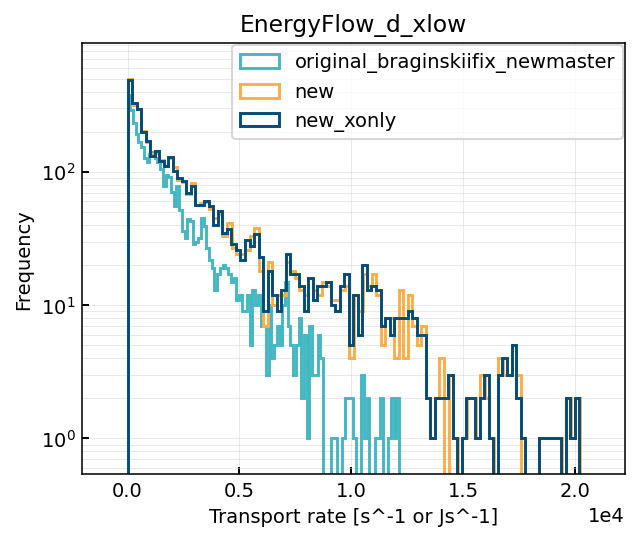

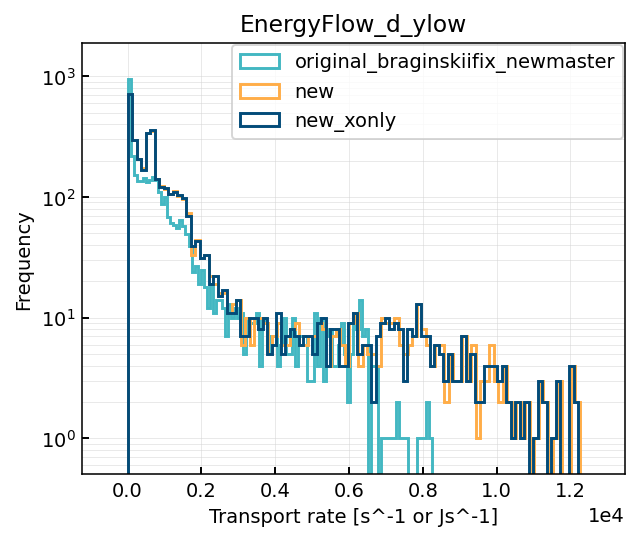

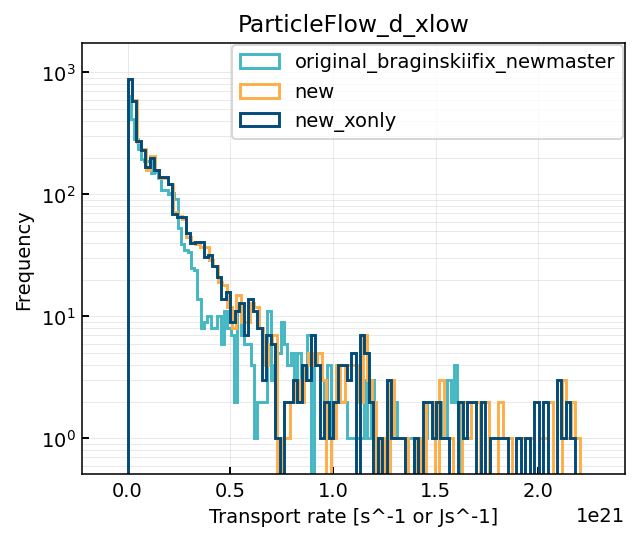

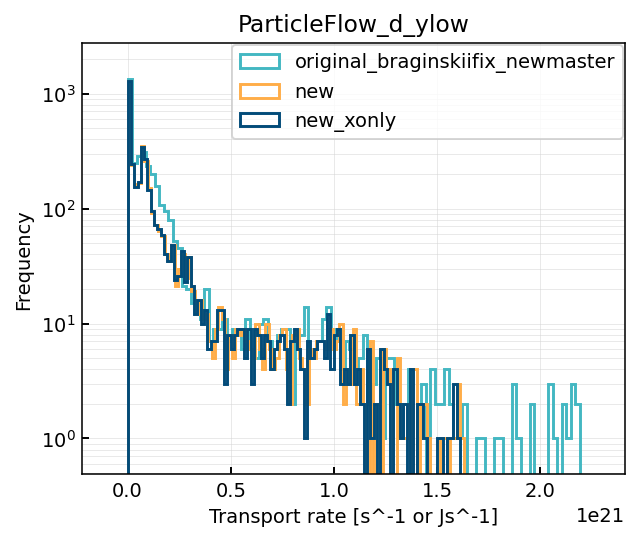

In [9]:



colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]

# nx = 6
# ny = 1
# fig, axes = plt.subplots(ny, nx, figsize = (3*nx, 3*ny))



for j, param in enumerate(["ConductionFlow_d_xlow", "ConductionFlow_d_ylow", "EnergyFlow_d_xlow", "EnergyFlow_d_ylow", "ParticleFlow_d_xlow", "ParticleFlow_d_ylow"]):

    fig, ax = plt.subplots()
    ax.set_title(param)
    ax.set_xlabel("Transport rate [s^-1 or Js^-1]")
    ax.set_ylabel("Frequency")

    for i, case in enumerate(cs):
        ds = cs[case].ds.isel(t=-1)

        if param in ds:
            n, bins, patches = ax.hist(
                x = abs(ds[param].hermesm.clean_guards().values.flatten()),
                bins = 100, alpha = 1, rwidth = 0.85, lw = 1.5, histtype = "step", color = colors[i], ls = "-",  label = f"{case}")

    ax.legend()
    ax.set_yscale("log")

## Correlation with slowdown

In [64]:
basedf["alph

,case,alpha,avg_speed,max_ycond
0,base,base,20.127353,3573.921584


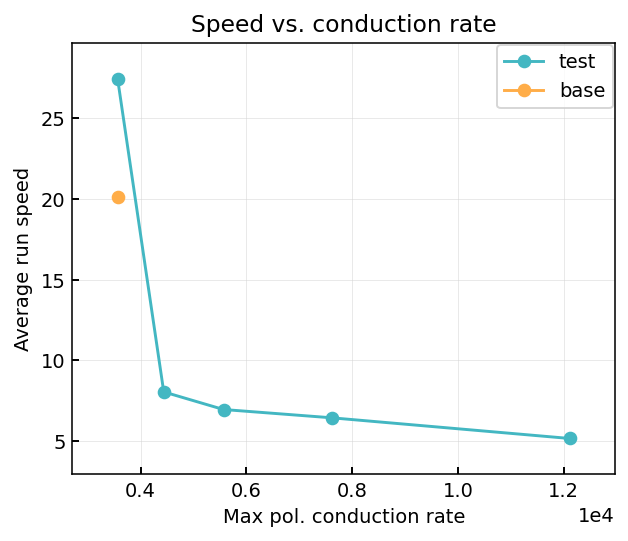

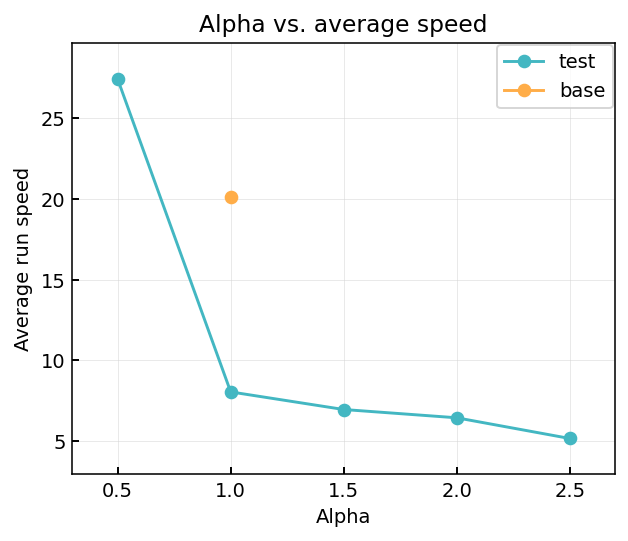

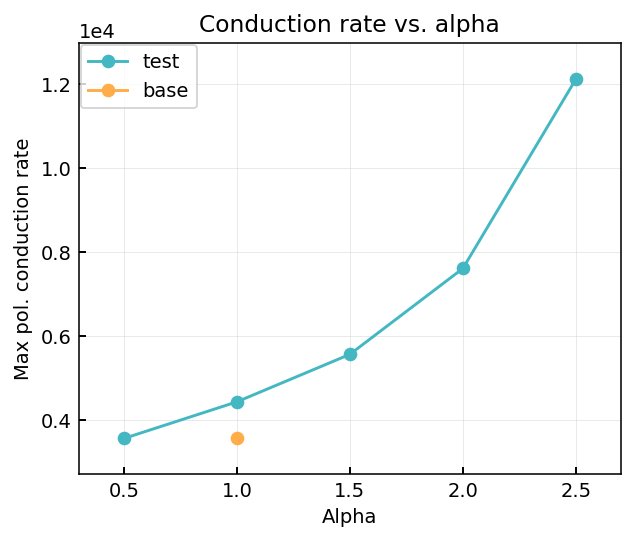

In [68]:
df = pd.DataFrame()

for i, case in enumerate(cs):
    # if case == "base": continue
    ds = cs[case].ds.isel(t=-1)
    df.loc[i, "case"] = case
    df.loc[i, "alpha"] = case.split("_")[-1]
    df.loc[i, "avg_speed"] = ds["ms_per_24hrs"].mean().values
    df.loc[i, "max_ycond"] = ds["ConductionFlow_d_ylow"].hermesm.clean_guards().max().values

    
basedf = df[df["case"] == "base"].copy()
basedf["alpha"] = 1
df = df.drop(df[df["case"] == "base"].index)

fig, ax = plt.subplots()
ax.plot(df["max_ycond"], df["avg_speed"], marker = "o", label = "test")
ax.plot([basedf["max_ycond"]], [basedf["avg_speed"]], marker = "o", label = "base")
ax.set_xlabel("Max pol. conduction rate")
ax.set_ylabel("Average run speed")
ax.set_title("Speed vs. conduction rate")
ax.legend()

fig, ax = plt.subplots()
ax.plot(df["alpha"], df["avg_speed"], marker = "o", label = "test")
ax.plot([basedf["alpha"]], [basedf["avg_speed"]], marker = "o", label = "base")
ax.set_xlabel("Alpha")
ax.set_ylabel("Average run speed")
ax.set_title("Alpha vs. average speed")
ax.legend()

fig, ax = plt.subplots()
ax.plot(df["alpha"], df["max_ycond"], marker = "o", label = "test")
ax.plot([basedf["alpha"]], [basedf["max_ycond"]], marker = "o", label = "base")
ax.set_xlabel("Alpha")
ax.set_ylabel("Max pol. conduction rate")
ax.set_title("Conduction rate vs. alpha")
ax.legend()

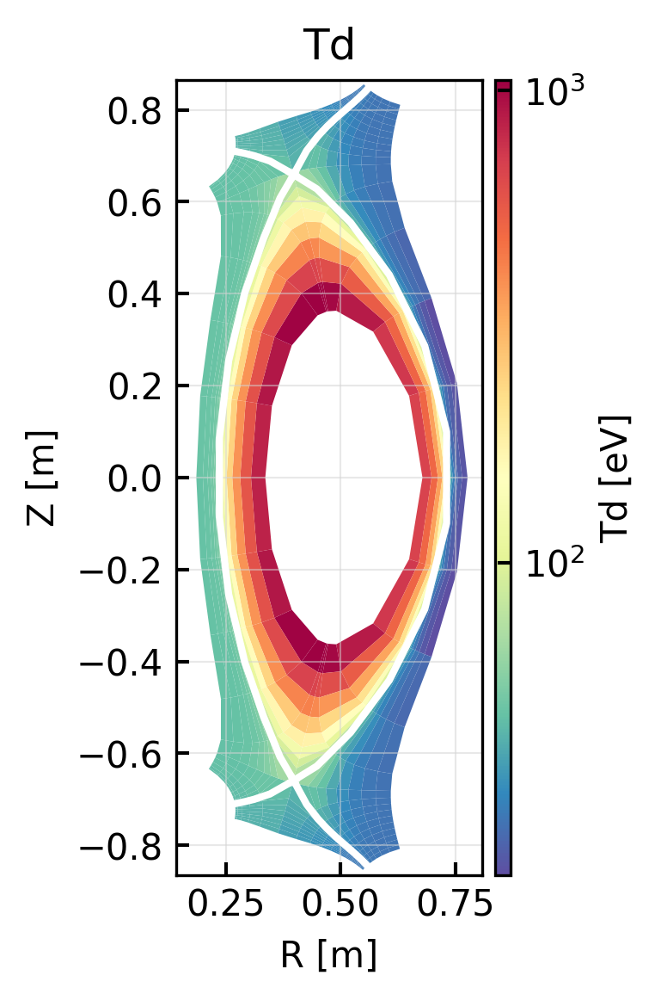

In [3]:
fig, ax = plt.subplots(dpi = 300)

ds = cs["sepcond_cfthr"].ds.isel(t=-1)

ds["Td"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", logscale = True, antialias = True)


In [61]:
ds.hermesm.select_region("core_edge")["Td"].values

array([[1.01058485e+03, 9.89918177e+02, 8.70679226e+02, 7.35647880e+02,
        6.92521159e+02, 6.92526961e+02, 7.35641273e+02, 8.70657812e+02,
        9.89842359e+02, 1.01054005e+03, 1.19630520e+40, 1.19630520e+40,
        1.19630520e+40, 1.19630520e+40, 1.19630520e+40, 8.44093285e+02,
        9.05413846e+02, 1.02308058e+03, 1.05365237e+03, 1.03412092e+03]])

# Core ring conduction

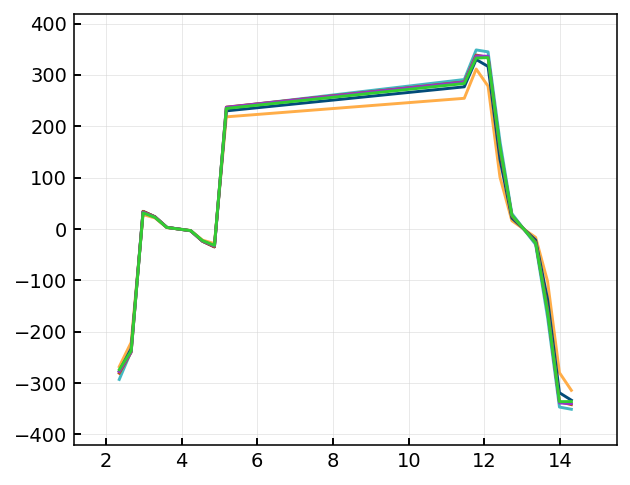

In [29]:
fig, ax = plt.subplots()

for case in cs:
    ds = cs[case].ds.isel(t=-1).hermesm.select_region("core_edge").squeeze().sortby("theta")
    
    ax.plot(ds["theta"], ds["ConductionFlow_d_ylow"], label = case)
    

# plot_selection(ds, ds.hermesm.select_region("core_edge"))

In [27]:
ds["ConductionFlow_d_ylow"].values

array([ 2.83336426e+02,  3.32881740e+02,  3.33841471e+02,  1.60258077e+02,
        2.71689357e+01, -3.32793888e-03, -2.72671642e+01, -1.61148993e+02,
       -3.36054217e+02, -3.35854930e+02, -2.73685710e+02, -2.37212226e+02,
        3.15452920e+01,  2.27115448e+01,  3.03574237e+00,  3.76769597e-04,
       -3.02587912e+00, -2.26185598e+01, -3.17857486e+01,  2.34872379e+02])

# Neutral parameter histograms

In [ ]:
fig, ax = plt.subplots(dpi = 160)

ds = cs["sepcond_cfthr"].ds.isel(t=0)
ds["Td"].hermesm.clean_guards().bout.polygon(ax = ax, cmap = "Spectral_r", logscale = True)


KeyError: 'base'

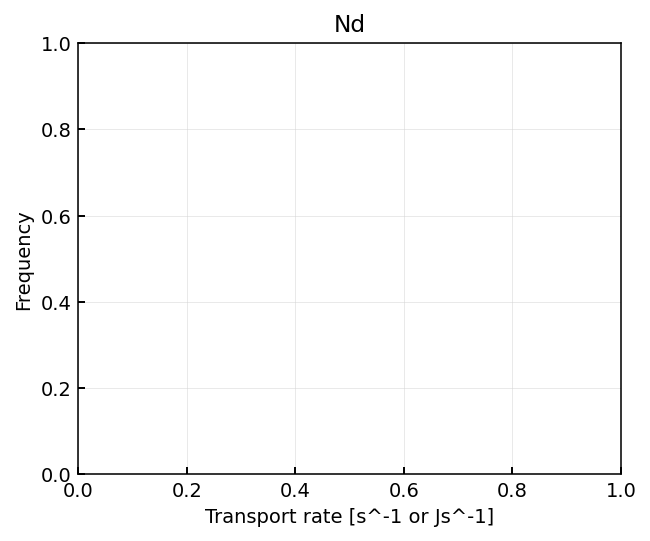

In [11]:


colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]

# nx = 6
# ny = 1
# fig, axes = plt.subplots(ny, nx, figsize = (3*nx, 3*ny))



for j, param in enumerate(["Nd", "Td", "Pd"]):

    fig, ax = plt.subplots()
    ax.set_title(param)
    ax.set_xlabel("Transport rate [s^-1 or Js^-1]")
    ax.set_ylabel("Frequency")

    for i, case in enumerate(["base", "sepcond_cfthr"]):
        ds = cs[case].ds.isel(t=-1)

        n, bins, patches = ax.hist(
            x = abs(ds[param].hermesm.clean_guards().values.flatten()),
            bins = "auto", alpha = 1, rwidth = 0.85, lw = 2, histtype = "step", color = colors[i], ls = "-",  label = f"{case}")

    ax.legend()
    ax.set_yscale("log")

# Neutral parameter variation histograms

In [7]:
current = ds.isel(t=-1)[param].hermesm.clean_guards().values.flatten()

current

array([nan, nan, nan, ..., nan, nan, nan])

In [15]:
current = ds.isel(t=-1)[param].values.flatten()
last = ds.isel(t=-2)[param].values.flatten()
current-last

array([-6.12438912e+08, -6.78570496e+08, -6.45504640e+08, ...,
       -1.51544525e+09, -1.70613504e+09, -1.32475494e+09])

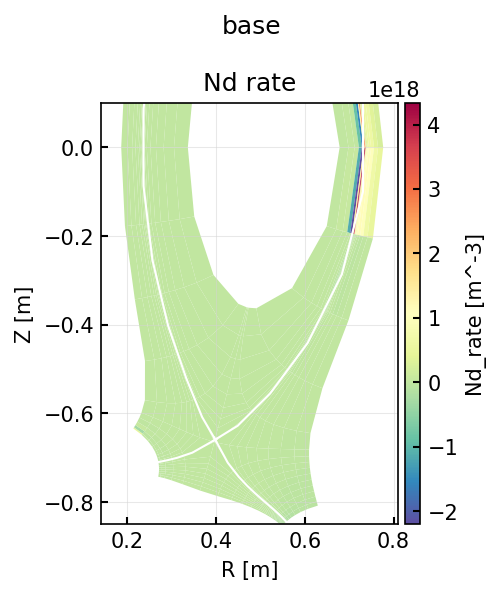

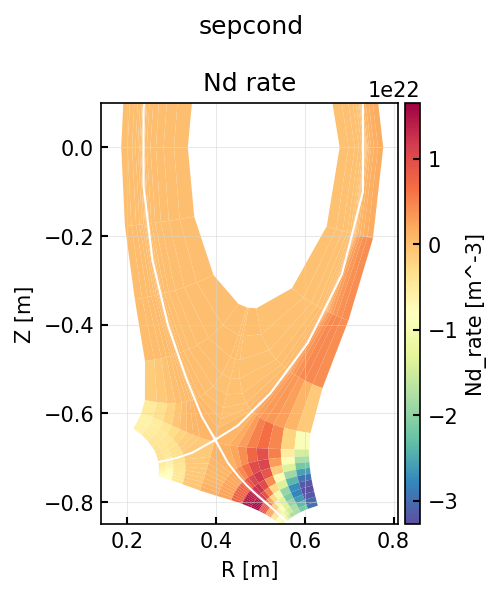

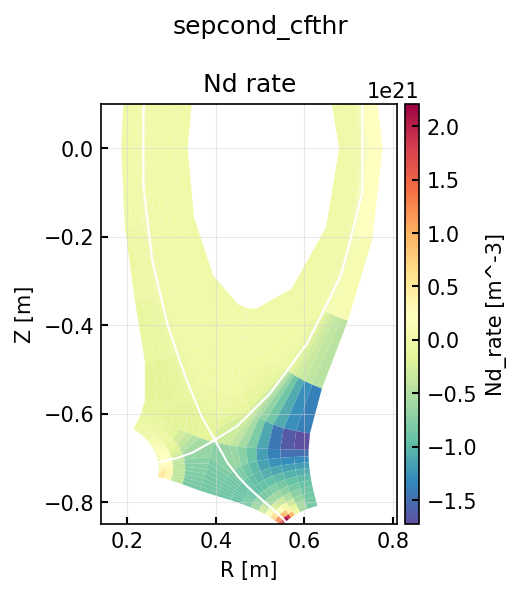

In [17]:
# for case in ["a1_mfp1e-4"]:
for case in cs:
# for case in ["base", "no_rnn_flim1"]:

    ds = cs[case].ds
    ds["Nd_rate"] = ds["Nd"].differentiate("t")
    ds["Nd_rate"].attrs = ds["Nd"].attrs
    # if "t" in ds.dims: ds = ds.isel(t=-1)
    plot2d(
        [
            dict(data = ds["Nd_rate"].isel(t=-1), title = "Nd rate", vmin = None, vmax = None, logscale = False),
            # dict(data = ds["kappa_n_d"] , vmin = None, vmax = None),
            # dict(data = ds["Nd"]),
            # dict(data = ds["Pd"]),
            # dict(data = ds["Dnnd"], vmin = 10, vmax = 1e5, logscale = True),
            ], 
            ylim = (-0.85, 0.1),
            title = f"{case}")

In [4]:
cs.keys()

dict_keys(['base', 'sepcond_bool', 'sepcond_bool_constcond', 'sepcond_bool_constcond_linonly'])

In [28]:
[print(x) for x in ds.data_vars if "kappa" in x]

kappa_d
kappa_n_Dnchained_d
kappa_n_d
kappa_n_max_d
kappa_n_unlimited_d
kappa_par_d+
kappa_par_e


[None, None, None, None, None, None, None]

In [ ]:


colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]

# nx = 6
# ny = 1
# fig, axes = plt.subplots(ny, nx, figsize = (3*nx, 3*ny))



for j, param in enumerate(
    ["Nd", "Td", "Pd", "Dnnd", "kappa_n_d", "kappa_n_unlimited_d", "kappa_n_max_d", "kappa_n_Dnchained_d"]
    # ["kappa_n_d"]
    ):

    fig, ax = plt.subplots()
    ax.set_title(param)
    ax.set_xlabel("Time")
    ax.set_ylabel("Frequency")

    for i, case in enumerate(cs.keys()):

        ds = cs[case].ds

        # data = ds[param].hermesm.clean_guards().differentiate("t").mean(["x", "theta"])
        
        # data = np.sqrt(ds[param].differentiate("t") **2).mean(["x", "theta"])
        
        data = np.sqrt((ds[param].diff("t")/ ds[param]) **2).mean(["x", "theta"])
        t = ds["t"] - ds["t"][0]
        t = t[1:]
        
        ax.plot(t, data, lw = 1, label = case)

        # n, bins, patches = ax.hist(
        #     x = rate,
        #     bins = "auto", alpha = 0.5, rwidth = 0.85, lw = 2, histtype = "step", color = colors[i], ls = "-",  label = f"{case}")

    ax.legend(loc = "upper center", bbox_to_anchor=(0.5, -0.15))
    ax.set_yscale("symlog", linthresh = 1e-7)
    ax.set_xlim(-0.1e-6, 2.2e-6)
    ax.set_ylim(-1e-7, 1e0)
    # ax.set_ylim(-1, 1e25)

In [20]:
cs.keys()

dict_keys(['base', 'sepcond_bool', 'sepcond_bool_constcond', 'sepcond_bool_constcond_linonly'])

In [4]:
%matplotlib inline

In [11]:
create_norm?

Signature: create_norm(logscale, norm, vmin, vmax, linthresh=None)
Docstring: <no docstring>
File:      /ssd_scratch/scripts/sdtools/hermes3/utils.py
Type:      function

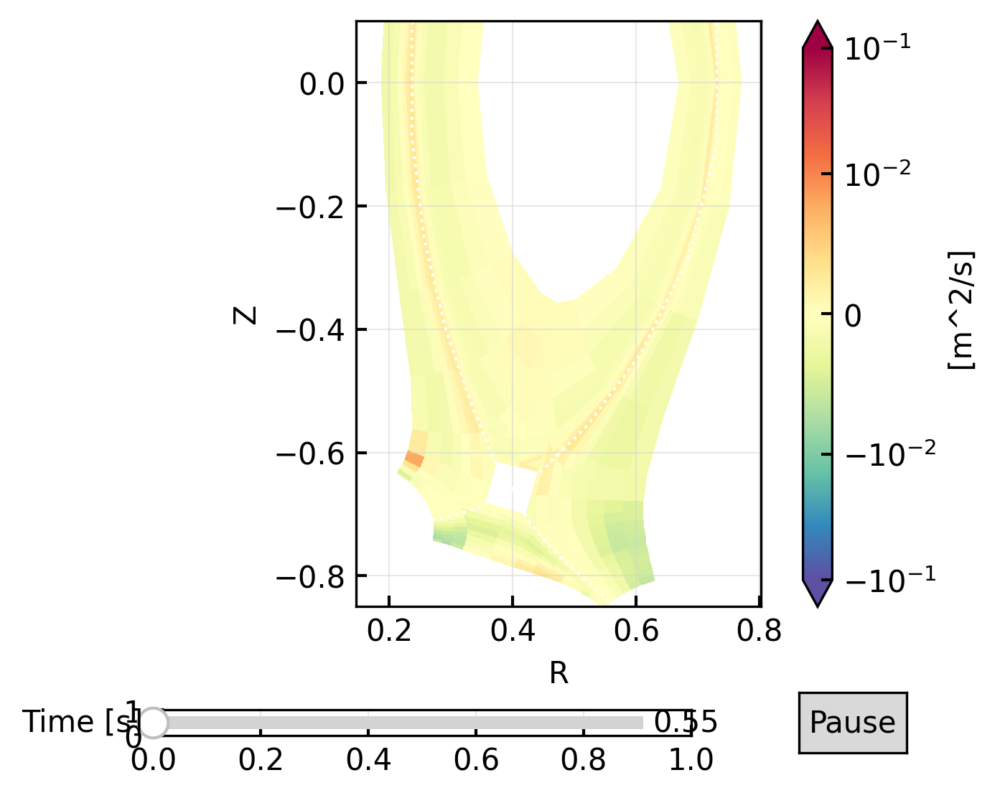

In [14]:
case = "sepcond_bool"

ds = cs[case].ds

fig, ax = plt.subplots(dpi = 300)
ax.set_ylim(-0.85, 0.1)

data = ds["kappa_n_d"].diff("t") / ds["kappa_n_max_d"]
data.attrs = ds["kappa_n_d"].attrs

norm = create_norm(True, None, -0.1, 0.1, 1e-2)

anim = xbout.animate_poloidal(data.hermesm.clean_guards(), ax = ax, 
    targets = False, cmap = "Spectral_r",   # PuOr 
    norm = norm,
    separatrix_kwargs = dict(color = "white", linestyle = ":", linewidth = 1),
    extend = "both",
    save_as = rf"/ssd_scratch/scripts/notebooks/131/{case}_kappamax_frac_change"
    # save_as = r"C:\Users\mikek\OneDrive\Project\collab\tech\cases\mastu2d\tune_4x_Rd+_ex"
)

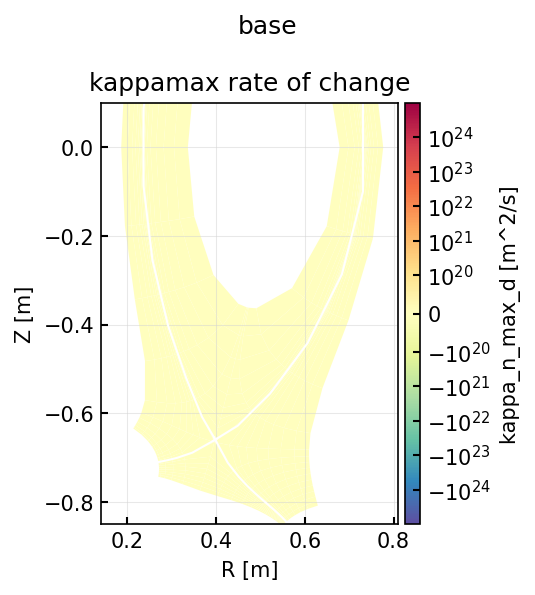

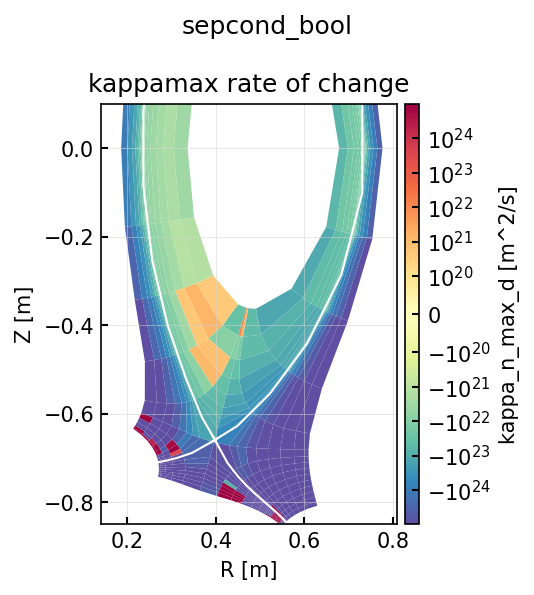

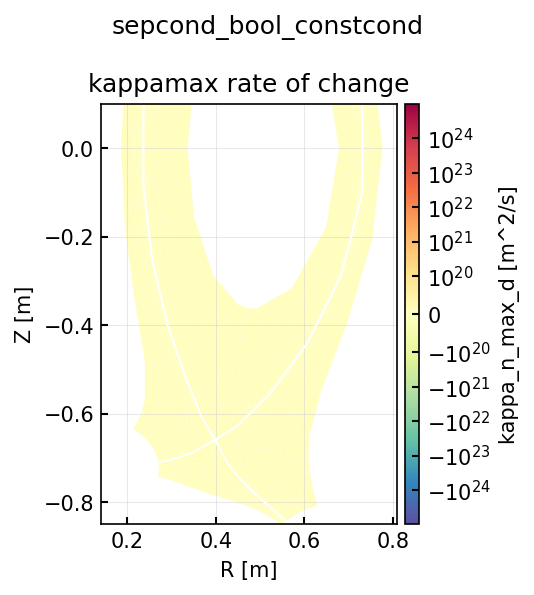

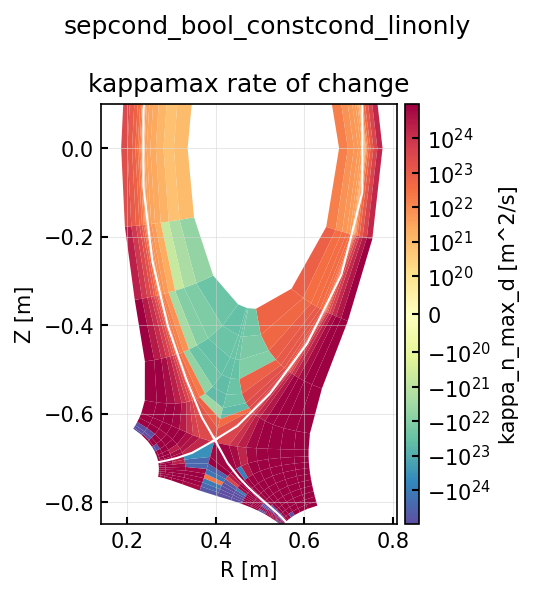

In [8]:
# for case in ["a1_mfp1e-4"]:
# for case in ["sepcond_bool"]:
# for case in ["base", "no_rnn_flim1"]:
for case in cs:

    ds = cs[case].ds
    # if "t" in ds.dims: ds = ds.isel(t=-1)
    
    data = ds["kappa_n_max_d"].differentiate("t").isel(t=-1)
    data.attrs = ds["kappa_n_max_d"].attrs
    
    plot2d(
        [
            dict(data = data, title = "kappamax rate of change", vmin = -1e25, vmax = 1e25, logscale = True),
            # dict(data = ds["kappa_n_d"] , vmin = None, vmax = None),
            # dict(data = ds["Nd"]),
            # dict(data = ds["Pd"]),
            # dict(data = ds["Dnnd"], vmin = 10, vmax = 1e5, logscale = True),
            ], 
            ylim = (-0.85, 0.1),
            title = f"{case}")

In [ ]:
toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))

    ds["conduction_timescale_x"] = ds["ConductionFlow_d_xlow"] / 
    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["Nd", "Td", "Pd", "NVd"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)

# Time evolution lineplots

In [6]:
cs.keys()

dict_keys(['original_braginskiifix_newmaster', 'new', 'new_xonly'])

C:\Users\mikek\AppData\Local\Temp\ipykernel_73120\763522123.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap("plasma", tres)(x) for x in range(tres)]


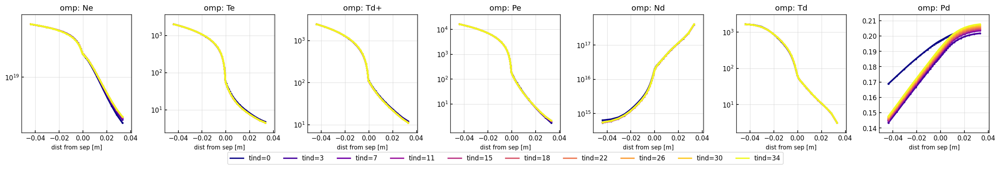

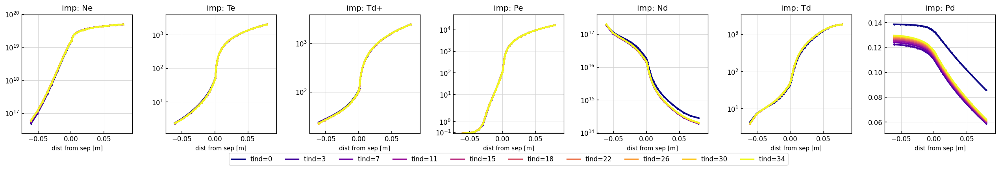

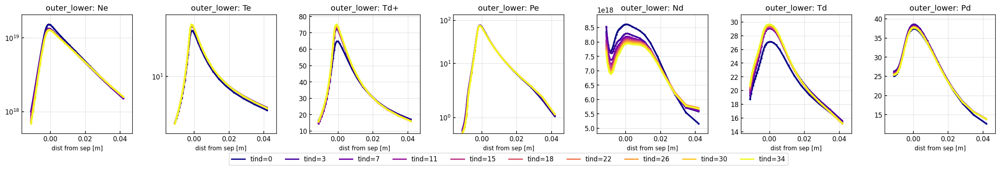

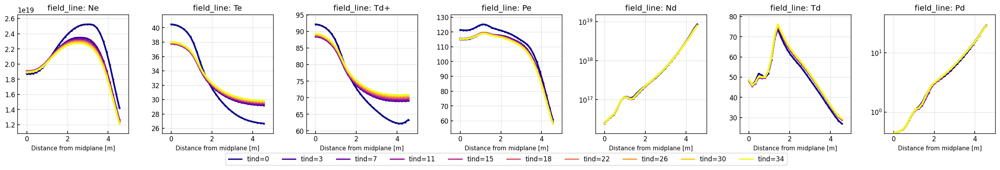

In [10]:
case = "original_braginskiifix_newmaster"
tlen = cs[case].ds.dims["t"]
tres = 10
ts = np.linspace(0, tlen-1, tres, dtype = int)
colors = [plt.cm.get_cmap("plasma", tres)(x) for x in range(tres)]

toplot = {}
for t in ts:
    toplot[f"tind={t}"] = cs[case].ds.isel(t=t, x = slice(3,-2))

lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    # params = ["Nd", "Td", "Pd", "ParticleFlow_d_xlow", "ConductionFlow_d_xlow"],
    params = ["Ne", "Te", "Td+", "Pe", "Nd", "Td", "Pd"],
    regions = ["omp", "imp", "outer_lower", "field_line"],
    colors = colors
)

In [4]:
cs.keys()

dict_keys(['base'])

# Kappa plots

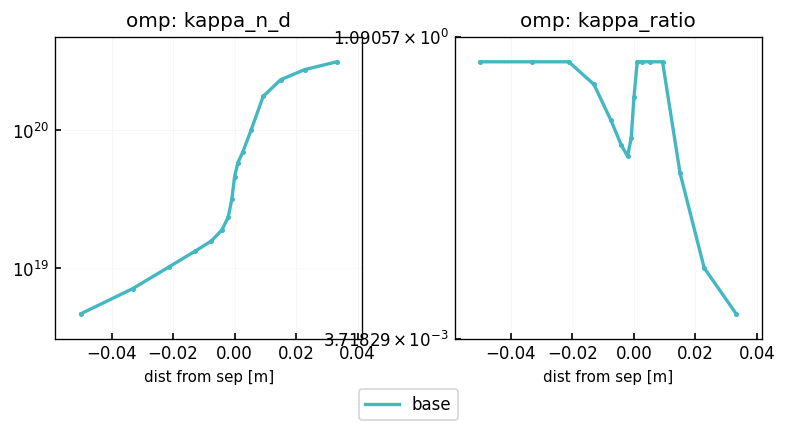

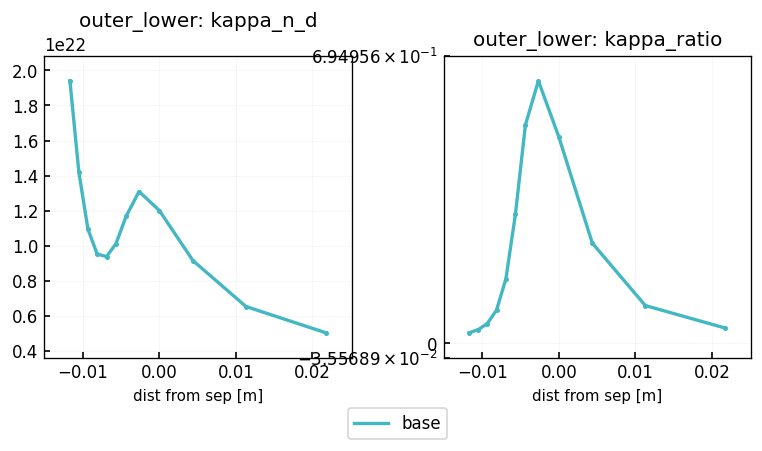

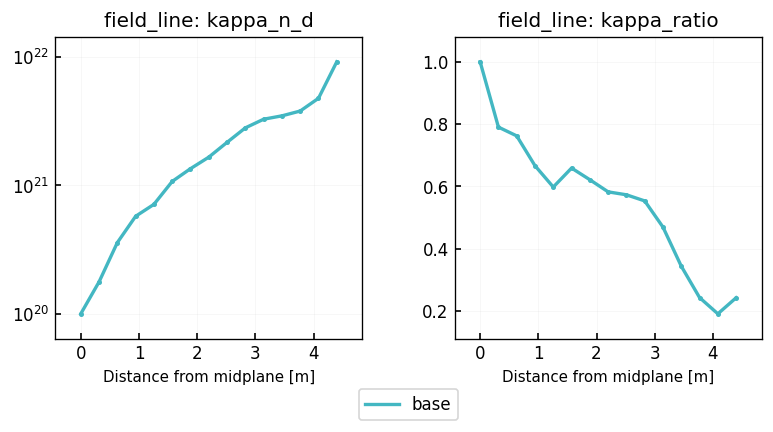

In [7]:
toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    ds["kappa_ratio"] = ds["kappa_n_d"] / ds["kappa_n_unlimited_d"]
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))

    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["kappa_n_d", "kappa_ratio"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)

## limiters etc

In [26]:
cs.keys()

dict_keys(['base', 'sepcond'])

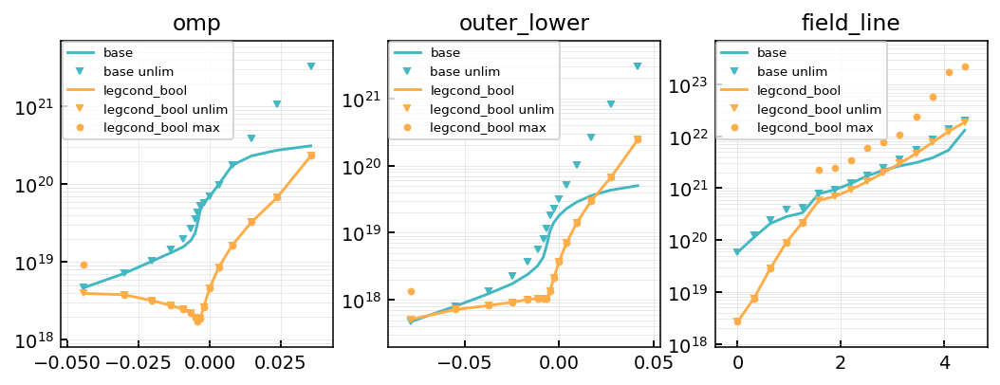

In [5]:
fig, axes = plt.subplots(1,3, figsize = (9,3))

colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]


for i, case in enumerate(cs):
# for i, case in enumerate(["base"]):

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)

    regions = dict(
        omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2)).squeeze(),
        outer_lower = ds.hermesm.select_region("inner_midplane_a").isel(x=slice(2,-2)).squeeze(),
        field_line = ds.hermesm.select_custom_sol_ring(ds.metadata["ixseps1"], "outer_lower").squeeze()
    )

    

    for j, region in enumerate(regions):
        reg = regions[region]

        if region == "field_line":
            dist = reg.coords["theta"] - reg.coords["theta"][0]
        else:
            R = reg["dr"].cumsum()
            dist = (R - R[ds.metadata["ixseps1"]])

        ax = axes[j]
        ax.plot(dist, reg["kappa_n_d"], color = colors[i], label = f"{case}")
        ax.plot(dist, reg["kappa_n_unlimited_d"], color = colors[i], marker = "v", lw = 0, ms = 3,  label = f"{case} unlim")
        if case != "base": ax.plot(dist, reg["kappa_n_max_d"], color = colors[i], marker = "o", lw = 0, ms = 3, label = f"{case} max")
        ax.set_title(region)
        # ax.plot(dist, reg["kappa_n_Dnchained_d"], color = colors[i], marker = "o", lw = 0, ms = 3, label = f"{case} max")

        ax.legend(fontsize = "x-small")
        ax.set_yscale("log")



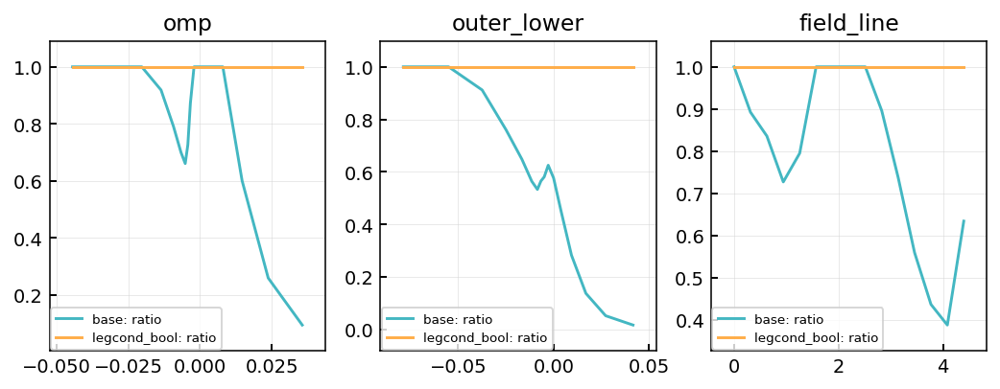

In [6]:
fig, axes = plt.subplots(1,3, figsize = (9,3))

colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]


for i, case in enumerate(cs):
# for i, case in enumerate(["base"]):

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)

    regions = dict(
        omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2)).squeeze(),
        outer_lower = ds.hermesm.select_region("inner_midplane_a").isel(x=slice(2,-2)).squeeze(),
        field_line = ds.hermesm.select_custom_sol_ring(ds.metadata["ixseps1"], "outer_lower").squeeze()
    )

    

    for j, region in enumerate(regions):
        reg = regions[region]

        if region == "field_line":
            dist = reg.coords["theta"] - reg.coords["theta"][0]
        else:
            R = reg["dr"].cumsum()
            dist = (R - R[ds.metadata["ixseps1"]])

        ax = axes[j]
        ax.plot(dist, reg["kappa_n_d"] / reg["kappa_n_unlimited_d"], color = colors[i], label = f"{case}: ratio")
        ax.set_title(region)
        ax.legend(fontsize = "x-small")
        ax.set_yscale("linear")



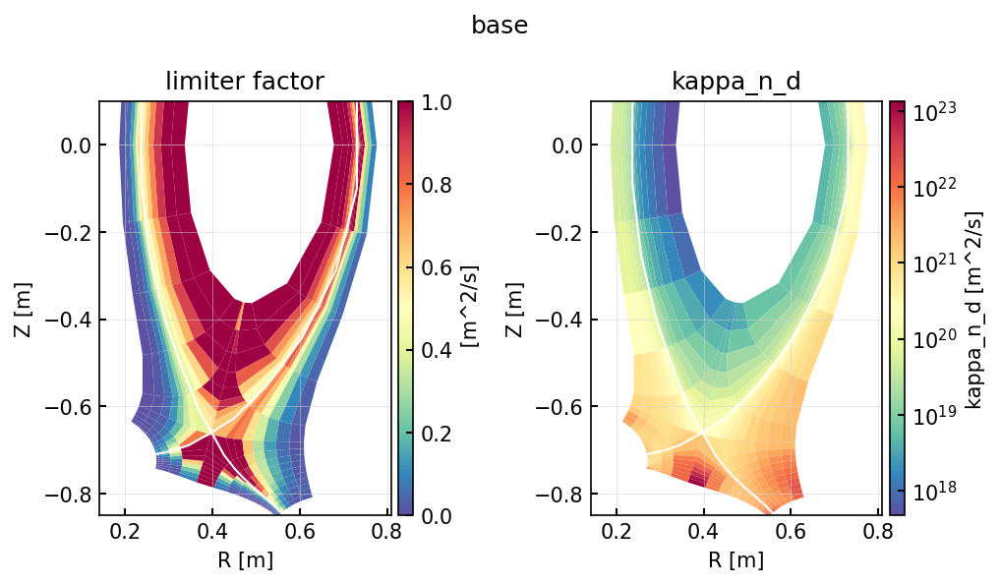

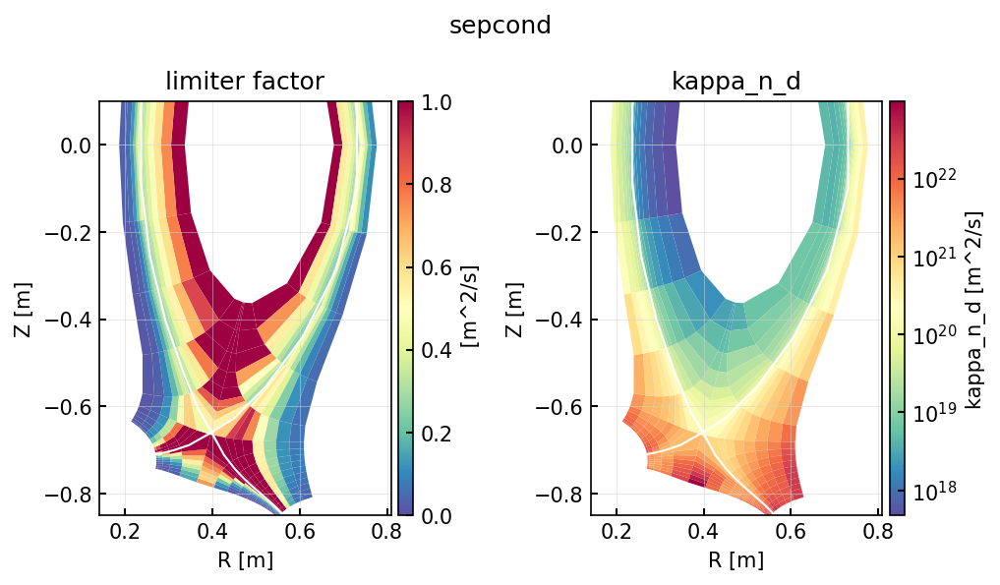

In [22]:
# for case in ["a1_mfp1e-4"]:
for case in cs:
# for case in ["base", "no_rnn_flim1"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    plot2d(
        [
            dict(data = ds["kappa_n_d"] / ds["kappa_n_unlimited_d"], title = "limiter factor", vmin = 0, vmax = 1, logscale = False),
            dict(data = ds["kappa_n_d"] , vmin = None, vmax = None),
            # dict(data = ds["Nd"]),
            # dict(data = ds["Pd"]),
            # dict(data = ds["Dnnd"], vmin = 10, vmax = 1e5, logscale = True),
            ], 
            ylim = (-0.85, 0.1),
            title = f"{case}")

# OMP plots

## DnnNn and gradperp

Text(0.5, 1.0, 'DnnNn')

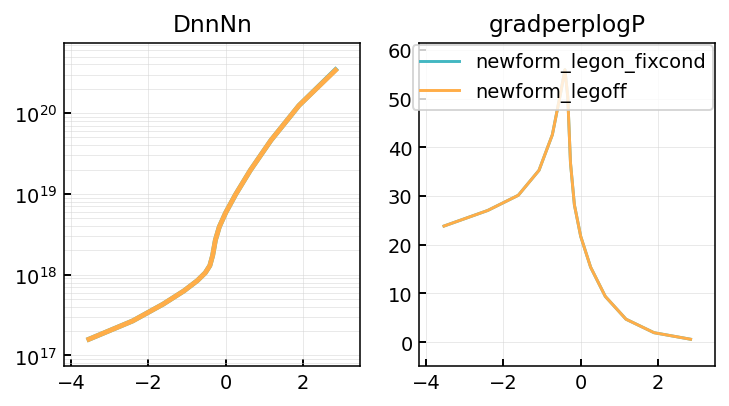

In [4]:
fig, axes = plt.subplots(1,2, figsize = (6,3))

for case in cs:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    reg = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2)).squeeze()
    R = reg["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    Mi = constants("mass_p") * 2
    e = constants("q_e")
    kwargs = dict(lw = 2.5)

    alpha = reg.options["d"]["advection_limit_alpha"]
    gamma = reg.options["d"]["flux_limit_gamma"]
    vth = 0.25 * np.sqrt((8 * reg["Td"] * e) / (np.pi * Mi))
    Dmax = alpha * vth / (reg["gradperplogP_d"] + 1/1e4) 

    v_perp = reg["Dnnd"] * reg["gradperplogP_d"]
    advection_flux_abs = reg["Nd"] * v_perp
    advection_limit = reg["Nd"] * vth
    # advection_factor = advection_flux_abs / advection_limit
    # advection_factor = (1 + (advection_flux_abs / (alpha * advection_limit))**(gamma))**(-1/gamma)
    advection_factor = advection_flux_abs / advection_limit

    ax = axes[0]
    ax.plot(dist/1000, reg["DnnNn_d"] * reg["advection_factor_d"], **kwargs, label = case)
    ax.set_yscale("log")

    ax = axes[1]
    ax.plot(dist/1000, reg["gradperplogP_d"], label = case)
    # ax.plot(dist/1000, reg["Dnnd"] , **kwargs, label = f"Dnn")

    ax.legend()

    # ax.set_yscale("log")

axes[1].set_title("gradperplogP")
axes[0].set_title("DnnNn")

## Tn and gradperpTn

Text(0.5, 1.0, 'gradperpTd')

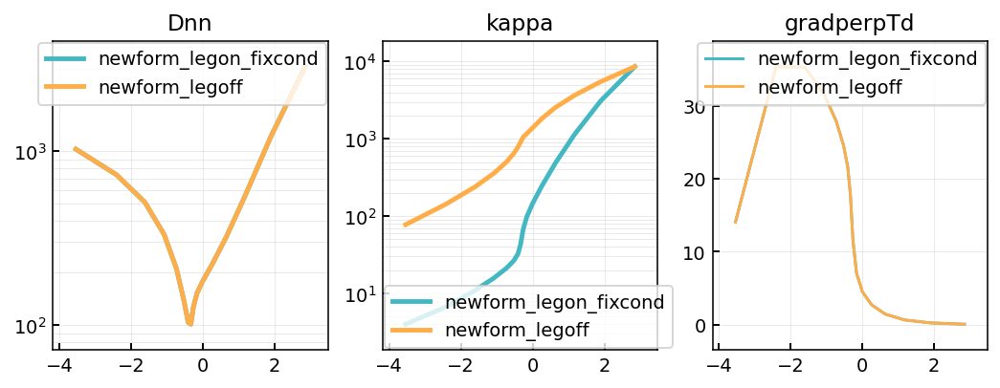

In [18]:
fig, axes = plt.subplots(1,3, figsize = (9,3))

for case in cs:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    reg = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2)).squeeze()
    R = reg["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    Mi = constants("mass_p") * 2
    e = constants("q_e")
    kwargs = dict(lw = 2.5)

    alpha = reg.options["d"]["advection_limit_alpha"]
    gamma = reg.options["d"]["flux_limit_gamma"]
    vth = 0.25 * np.sqrt((8 * reg["Td"] * e) / (np.pi * Mi))
    Dmax = alpha * vth / (reg["gradperplogP_d"] + 1/1e4) 

    v_perp = reg["Dnnd"] * reg["gradperplogP_d"]
    advection_flux_abs = reg["Nd"] * v_perp
    advection_limit = reg["Nd"] * vth
    # advection_factor = advection_flux_abs / advection_limit
    # advection_factor = (1 + (advection_flux_abs / (alpha * advection_limit))**(gamma))**(-1/gamma)
    advection_factor = advection_flux_abs / advection_limit

    ax = axes[0]
    ax.plot(dist/1000, reg["Dnnd"] * reg["advection_factor_d"], **kwargs, label = case)
    ax.set_yscale("log")
    ax.legend()

    ax = axes[1]
    ax.plot(dist/1000, reg["kappa_d"] * reg["conduction_factor_d"], **kwargs, label = case)
    ax.set_yscale("log")
    ax.legend()
    
    ax = axes[2]
    ax.plot(dist/1000, reg["gradperpTd"], label = case)
    # ax.plot(dist/1000, reg["Dnnd"] , **kwargs, label = f"Dnn")

    ax.legend()

    # ax.set_yscale("log")

axes[0].set_title("Dnn")
axes[1].set_title("kappa")
axes[2].set_title("gradperpTd")

## Dnn

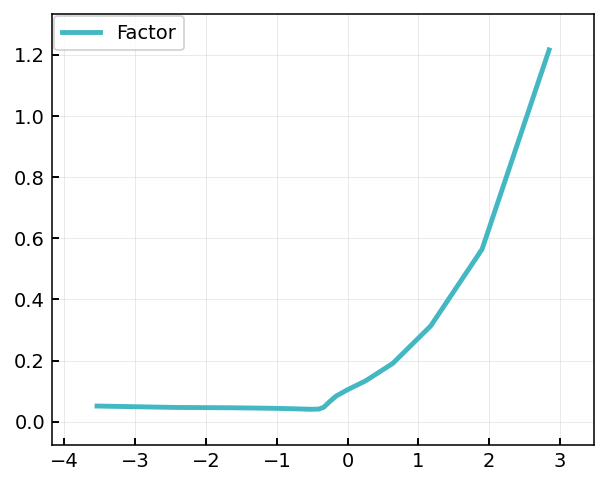

In [5]:
fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)

alpha = reg.options["d"]["advection_limit_alpha"]
gamma = reg.options["d"]["flux_limit_gamma"]
vth = 0.25 * np.sqrt((8 * reg["Td"] * e) / (np.pi * Mi))
Dmax = alpha * vth / (reg["gradperplogP_d"] + 1/1e4) 

v_perp = reg["Dnnd"] * reg["gradperplogP_d"]
advection_flux_abs = reg["Nd"] * v_perp
advection_limit = reg["Nd"] * vth
# advection_factor = advection_flux_abs / advection_limit
# advection_factor = (1 + (advection_flux_abs / (alpha * advection_limit))**(gamma))**(-1/gamma)
advection_factor = advection_flux_abs / advection_limit

# ax.plot(dist/1000, reg["vth_d"] , **kwargs, label = f"vth")
# ax.plot(dist/1000, vth , **kwargs, label = f"Vth check", marker = "o")

# ax.plot(dist/1000, reg["Dmax_d"] , **kwargs, label = f"Dmax")
# ax.plot(dist/1000, Dmax , label = f"Dmax check", marker = "o", lw = 0)

# ax.plot(dist/1000, reg["Dnn_unlimd"] , **kwargs, label = f"Dnn_unlim")
ax.plot(dist/1000, Dmax / reg["Dnn_unlimd"] , **kwargs, label = f"Factor")
# ax.plot(dist/1000, reg["Dnnd"] , **kwargs, label = f"Dnn")

ax.legend()

# ax.set_yscale("log")

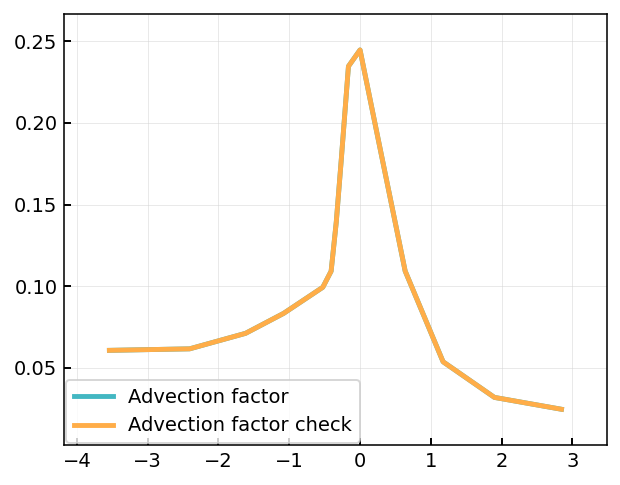

In [29]:

fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)


ds = cs["newform_legoff"].ds
if "t" in ds.dims: ds = ds.isel(t=-1)
reg = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2)).squeeze()
R = reg["dr"].cumsum()
dist = (R - R[ds.metadata["ixseps1"]])

Mi = constants("mass_p") * 2
e = constants("q_e")
alpha = reg.options["d"]["advection_limit_alpha"]
gamma = reg.options["d"]["flux_limit_gamma"]
vth = 0.25 * np.sqrt((8 * reg["Td"] * e) / (np.pi * Mi))
Dmax = alpha * vth / (reg["gradperplogP_d"] + 1/1e4) 

v_perp = reg["Dnnd"] * reg["gradperplogP_d"]
advection_flux_abs = reg["Nd"] * v_perp
advection_limit = reg["Nd"] * vth
# advection_factor = advection_flux_abs / advection_limit
# advection_factor = (1 + (advection_flux_abs / (alpha * advection_limit))**(gamma))**(-1/gamma)
advection_factor = alpha * advection_limit / (advection_flux_abs)

# ax.plot(dist/1000, Dmax / reg["Dnn_unlimd"] , **kwargs, label = f"Old form factor")
# ax.plot(dist/1000, reg["advection_factor_d"] , **kwargs, label = f"New form factor")

# ax.plot(dist/1000, reg["advection_flux_abs_d"] , **kwargs, label = f"Advection flux")
# ax.plot(dist/1000, reg["advection_flux_abs_d"] * reg["advection_factor_d"] , **kwargs, label = f"Limited flux")

# ax.plot(dist/1000, reg["advection_limit_d"] , **kwargs, label = f"Advection limit")
# ax.plot(dist/1000, advection_limit , **kwargs, label = f"Advection limit check", marker = "o")

# ax.plot(dist/1000, reg["advection_flux_abs_d"] , **kwargs, label = f"Advection flux")
# ax.plot(dist/1000, advection_flux_abs , **kwargs, label = f"Advection flux check", marker = "o")

ax.plot(dist/1000, reg["advection_factor_d"] , **kwargs, label = f"Advection factor")
ax.plot(dist/1000, advection_factor , **kwargs, label = f"Advection factor check")

# ax.plot(dist/1000, reg["vth_d"] , **kwargs, label = f"vth")
# ax.plot(dist/1000, vth , **kwargs, label = f"Vth check", marker = "o")

# ax.plot(dist/1000, reg["Dmax_d"] , **kwargs, label = f"Dmax")
# ax.plot(dist/1000, Dmax , label = f"Dmax check", marker = "o", lw = 0)

# ax.plot(dist/1000, reg["Dnn_unlimd"] , **kwargs, label = f"Dnn_unlim")
# ax.plot(dist/1000, reg["Dnnd"] , **kwargs, label = f"Dnn")

ax.legend()

# ax.set_yscale("log")

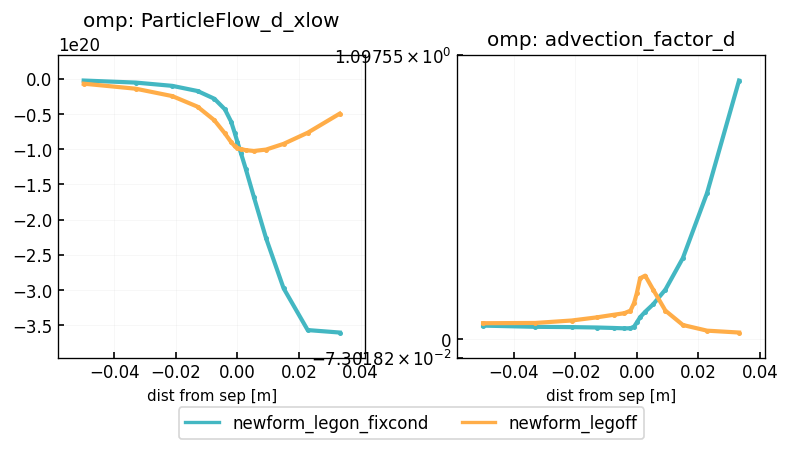

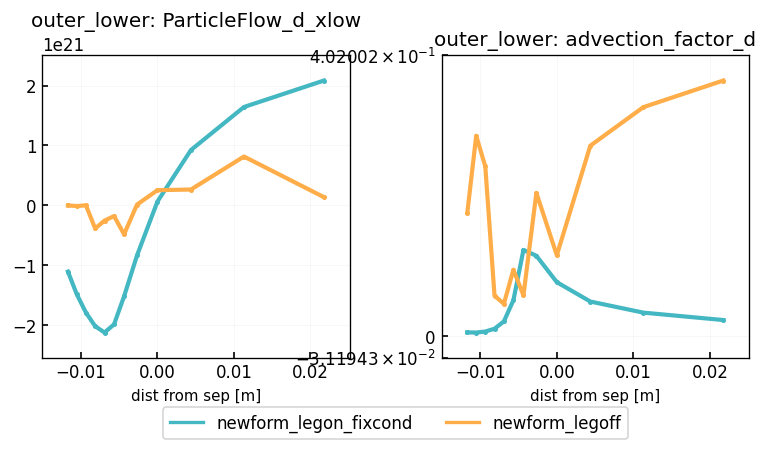

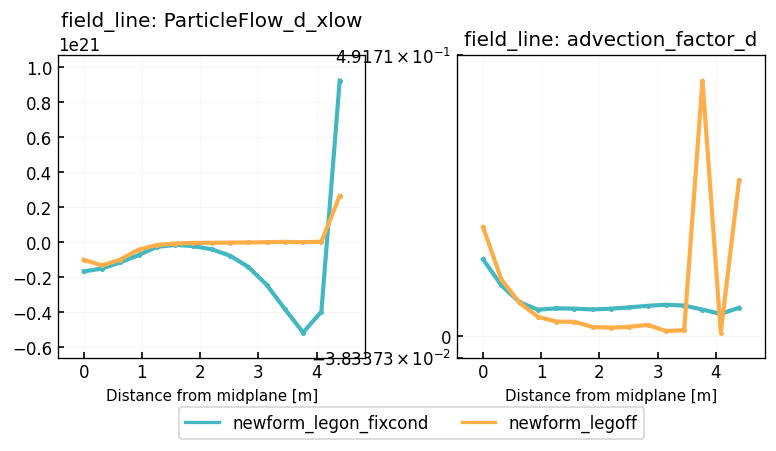

In [ ]:
name = "newform_legon_fixcond"
ds = cs[name].ds
ds["advection_factor_d"] = ds["Dnnd"] / ds["Dnn_unlimd"]
cs[name].ds = ds

toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))
    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["ParticleFlow_d_xlow", "advection_factor_d"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)

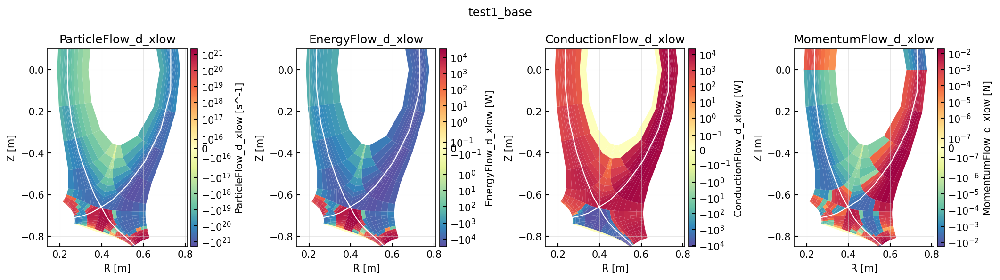

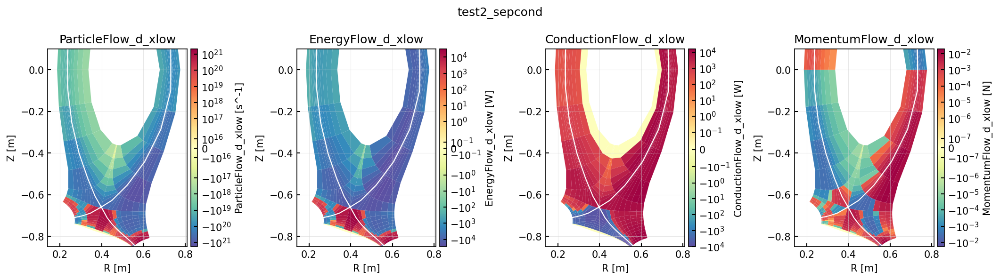

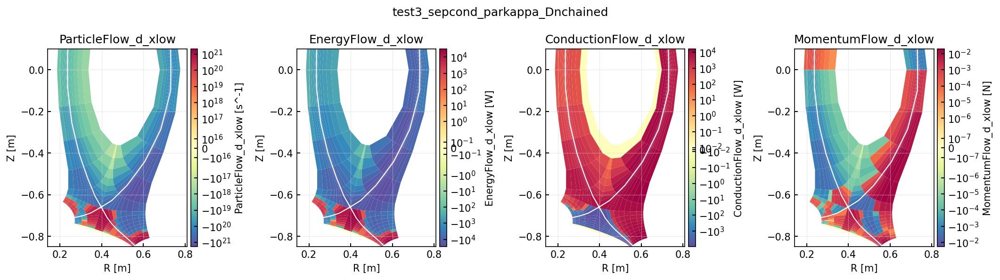

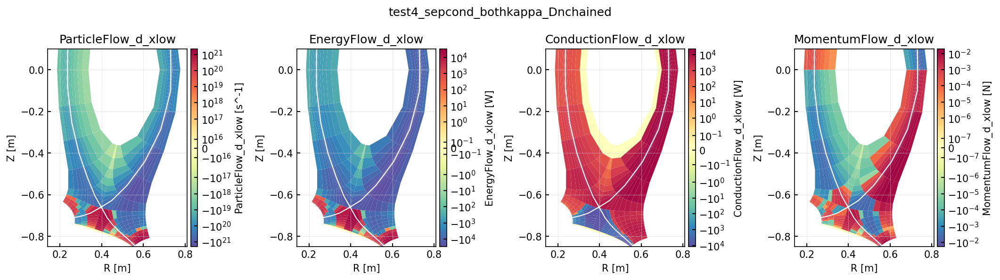

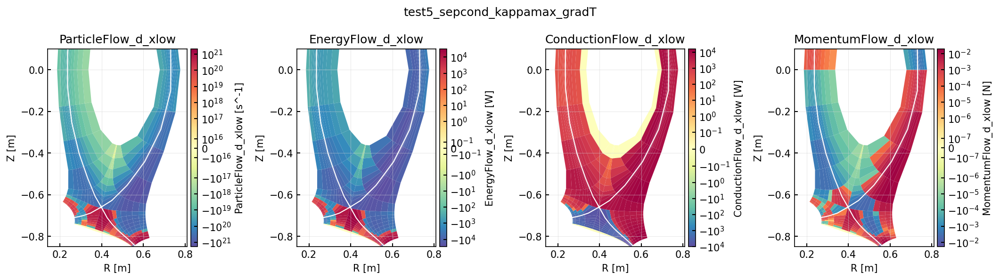

In [4]:
for case in cs:
    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)

    plot2d(
        [
            # dict(data = ds["Nd"]),
            dict(data = ds["ParticleFlow_d_xlow"], logscale = True, vmin = None, vmax = None),
            dict(data = ds["EnergyFlow_d_xlow"], logscale = True, vmin = None, vmax = None),
            dict(data = ds["ConductionFlow_d_xlow"], logscale = True, vmin = None, vmax = None),
            dict(data = ds["MomentumFlow_d_xlow"], logscale = True, vmin = None, vmax = None),
            # dict(data = ds["advection_factor_d"], logscale = False, vmin = 0, vmax = 1, title = "Limiter factor"),
            ], 
            ylim = (-0.85, 0.1),
            title = case,
            clean_guards = True)

# 2D plots of limiters

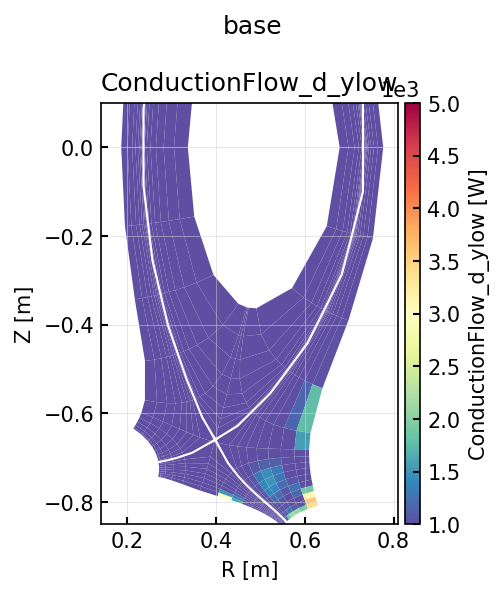

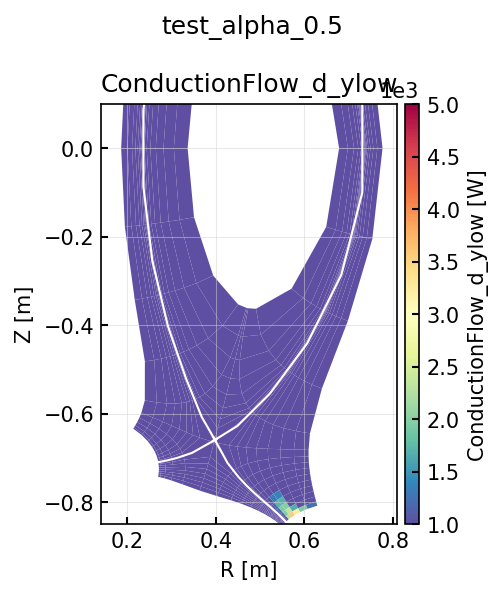

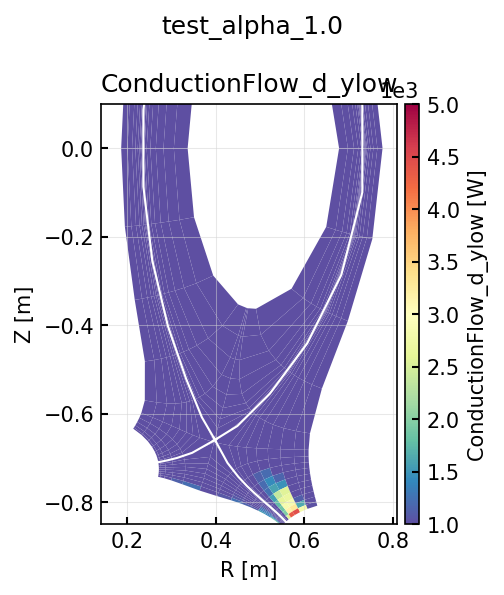

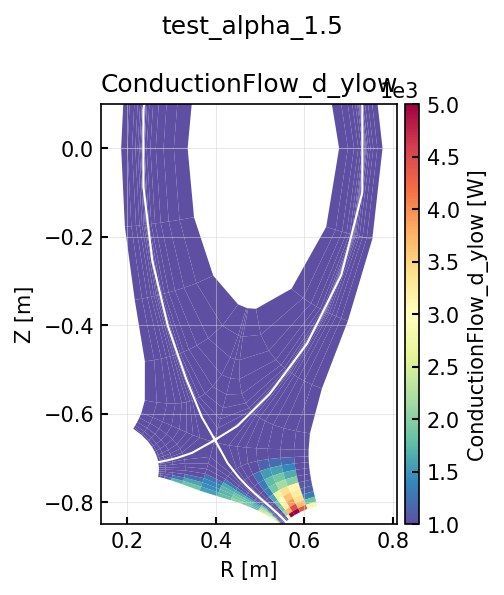

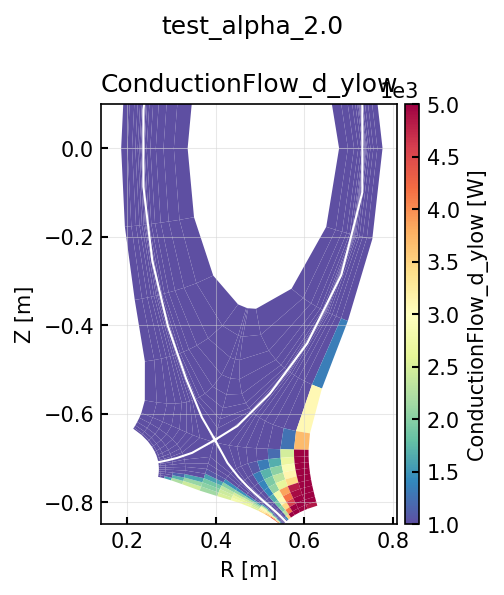

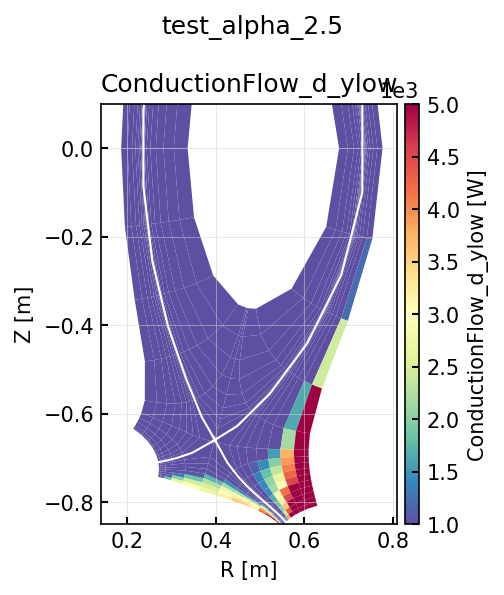

In [33]:
# for case in ["base"]:
# for case in ["base", "no_rnn_flim1"]:

# name = "newform_legon"
# ds = cs[name].ds
# ds["advection_factor_d"] = ds["Dnnd"] / ds["Dnn_unlimd"]
# cs[name].ds = ds

for case in cs:
# for case in ["test"]:
    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
            
    # Dmax = (np.nanmax(ds["Dnn_unlimd"].hermesm.clean_guards().values) + np.nanmax(ds["Dnnd"].hermesm.clean_guards().values)).max()
    # Dmin = (np.nanmin(ds["Dnn_unlimd"].hermesm.clean_guards().values) + np.nanmin(ds["Dnnd"].hermesm.clean_guards().values)).min()
    
    plot2d(
        [
            # dict(data = ds["Nd"]),
            # dict(data = ds["Td"], logscale = True, vmin = None, vmax = None),
            # dict(data = ds["gradperplogP_d"]),
            
            # dict(data = ds["gradlogP_d"], logscale = False),
            # dict(data = ds["Pd"], logscale = True),
            # dict(data = ds["gradperplogP_d"], logscale = False, title = "Grad_perp(Pd)/Pd"),
            # dict(data = ds["Dnn_unlimd"], vmin = 1e2, vmax = 1e5, title = "Unlimited Dn"),
            # dict(data = ds["Dnnd"], vmin = 1e2, vmax = 1e5, logscale = True, title = "Limited Dn"),
            # dict(data = ds["Dmax_d"], vmin = 1e2, vmax = 1e5, logscale = True, title = "Max Dn"),
            # dict(data = ds["Dnnd"] / ds["Dnn_unlimd"], logscale = False, vmin = 0, vmax = 1, title = "Limiter factor"),
            # dict(data = ds["advection_factor_d"], logscale = False, vmin = 0, vmax = 1, title = "Limiter factor"),
            
            dict(data = ds["ConductionFlow_d_ylow"], logscale = False, vmin = 1e3, vmax = 5e3),
            ], 
            ylim = (-0.85, 0.1),
            title = case,
            clean_guards = True)

In [4]:
cs.keys()

dict_keys(['base', 'a1_mfp1e-4'])

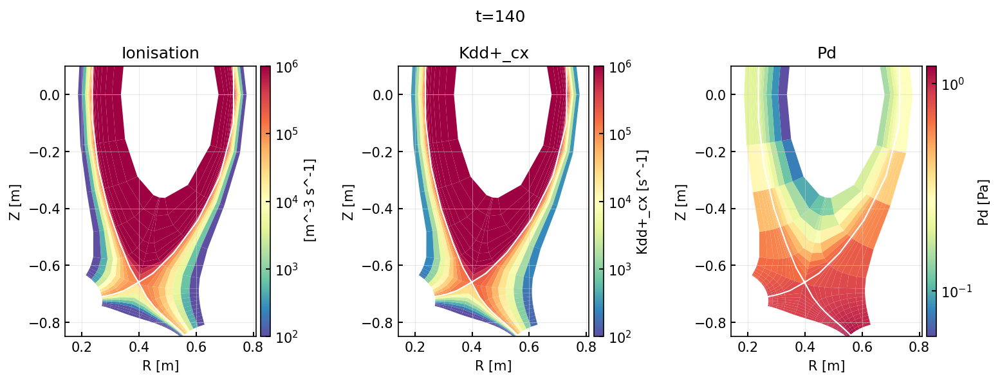

In [13]:
for case in ["a1_mfp1e-4"]:
# for case in ["base", "no_rnn_flim1"]:


    ds = cs[case].ds.isel(t=-1)
    plot2d(
        [
            dict(data = ds["Sd+_iz"] / ds["Nd"], title = "Ionisation", vmin = 1e2, vmax = 1e6),
            dict(data = ds["Kdd+_cx"] , vmin = 1e2, vmax = 1e6),
            # dict(data = ds["Nd"]),
            dict(data = ds["Pd"]),
            # dict(data = ds["Dnnd"], vmin = 10, vmax = 1e5, logscale = True),
            ], 
            ylim = (-0.85, 0.1),
            title = f"t={t}")

# Performance

In [13]:
cs.keys()

dict_keys(['sepcond_asymp_gamma1', 'sepcond_asympadvcond_gamma1', 'sepcond_asymp', 'base'])

In [ ]:
[print(x) for x in ds.data_vars if "cvode" in x]

cvode_last_order
cvode_last_step
cvode_nfevals
cvode_nliters
cvode_nniters
cvode_nonlin_fails
cvode_npevals
cvode_nsteps
cvode_num_fails
cvode_stab_lims


[None, None, None, None, None, None, None, None, None, None]

In [3]:
def get_noncum_cvode(data):
    data = np.diff(data.values, prepend = data.values[0])
    for i, x in enumerate(data):
        if x < 0:
            data[i] = data[i+1]
    return data

for name in cs:
    ds = cs[name].ds
    m = ds.metadata
    # data = ds.hermesm.select_region("outer_midplane_a")["Ne"].isel(x=10)
    wtime = ds["wtime"]
    t = ds["t"]
    stime = np.diff(t, prepend = t[0])
    ds["ms_per_24hrs"] = (stime * 1000) / (wtime/(60*60*24))  # ms simulated per 24 hours
    ds["nonlin_fails"] = get_noncum_cvode(ds["cvode_nonlin_fails"])
    ds["lin_per_nonlin"] = get_noncum_cvode(ds["cvode_nliters"]) / get_noncum_cvode(ds["cvode_nniters"])
    ds["precon_per_function"] = get_noncum_cvode(ds["cvode_npevals"]) / get_noncum_cvode(ds["cvode_nfevals"])
    # ds["precon_per_function"] = get_noncum_cvode(ds["cvode_npevals"]) / get_noncum_cvode(ds["cvode_nfevals"])
    
    ds["ms_per_24hrs"].attrs["units"] = "ms plasma time / 24hr wall time"
    ds["nonlin_fails"].attrs["units"] = "nonlinear fails per step"
    ds["lin_per_nonlin"].attrs["units"] = "linear its / nonlinear it"
    ds["precon_per_function"].attrs["units"] = "precon evals / function evals"
    cs[name].ds = ds


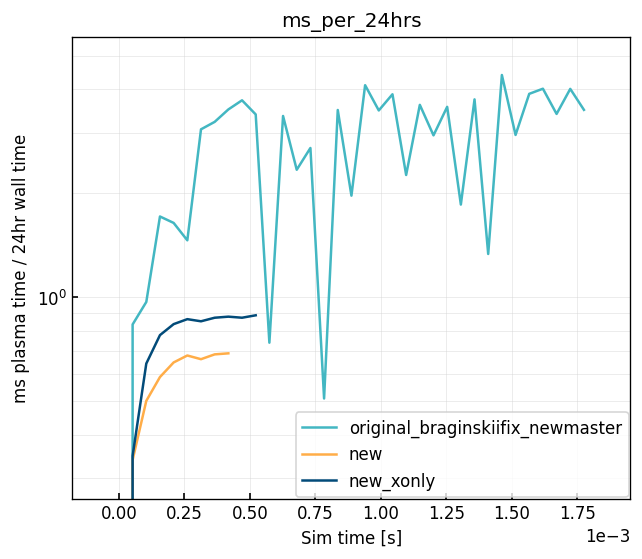

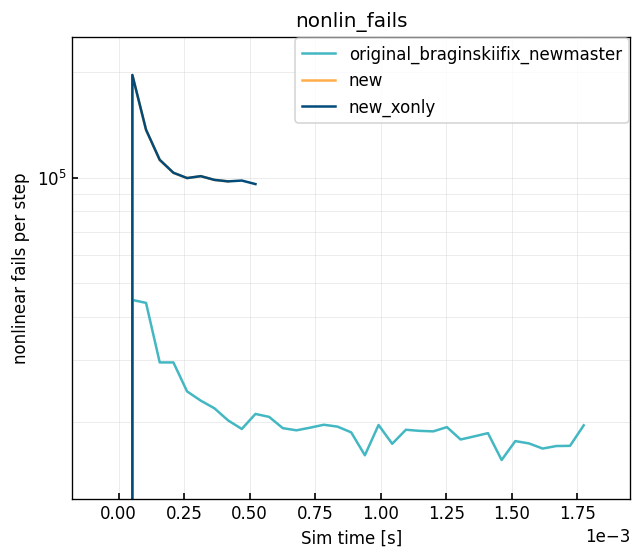

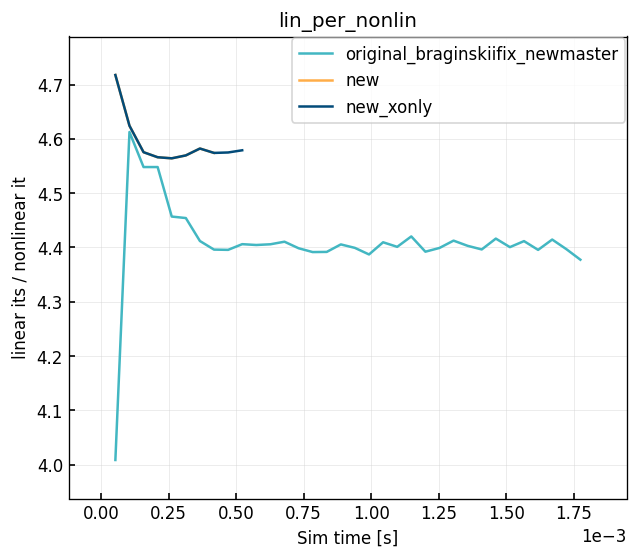

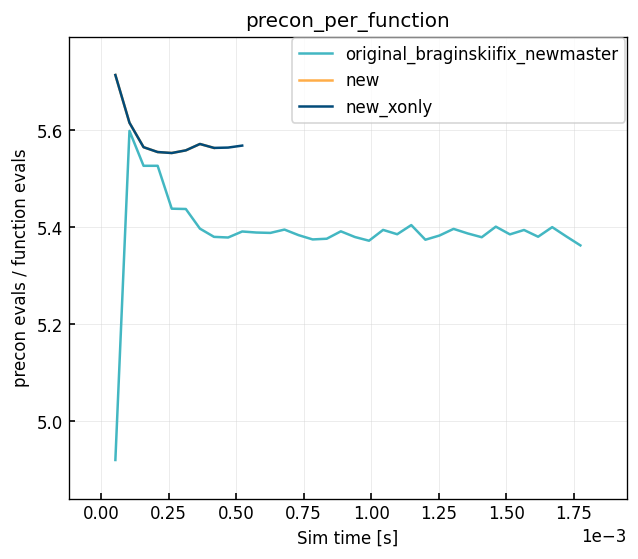

In [4]:
for param in ["ms_per_24hrs", "nonlin_fails", "lin_per_nonlin", "precon_per_function"]:
# for param in ["ms_per_24hrs"]:
    scale = "log"
    fig, ax = plt.subplots(figsize=(6,5), dpi = 120)
    logscale = True
    for name in cs:
        ds = cs[name].ds
        ax.plot(ds["t"] - ds["t"][0], ds[param], label = name)
    ax.legend()
    ax.set_title(param)
    ax.set_ylabel(ds[param].attrs["units"])
    ax.set_xlabel("Sim time [s]")
    
    if scale == "log" and any([x in param for x in ["ms_per", "nonlin_fails"]]):
        ax.set_yscale(scale)

    # ax.set_xlim(-0.2e-6,2e-6) 

In [6]:
cs.keys()

dict_keys(['base', 'base_viking', 'test', 'test_viking'])

In [68]:
dsd = {}
dsd["base"] = cs["base"].ds
dsd["base_v"] = cs["base_viking"].ds
dsd["test"] = cs["test"].ds
dsd["test_v"] = cs["test_viking"].ds

dfs = {}

for case in dsd.keys():

    dfs[case] = pd.DataFrame()
    

    dfs[case]["t"] = dsd[case]["t"].values - dsd[case]["t"].values[0]
    dfs[case].index.name = "index"
    dfs[case][case] = dsd[case]["ms_per_24hrs"].values
    # df["base"] = ds_base["ms_per_24hrs"].values
    # df["base_v"] = ds_base_v["ms_per_24hrs"].values
    # df["test"] = ds_test["ms_per_24hrs"].values
    # df["base_v"] = ds_base_v["ms_per_24hrs"].values

    
# pd.merge(dfs["base"], dfs["test"], left_index = True, right_index = True,  how = "left")
df = pd.merge(dfs["base"], dfs["test"], left_on = "index", right_on = "index",  how = "left")
df = df.drop(["t_x", "t_y"], axis = 1)
df = pd.merge(df, dfs["test_v"], left_on = "index", right_on = "index",  how = "left")
df = df.drop(["t"], axis = 1)
df = pd.merge(df, dfs["base_v"], left_on = "index", right_on = "index",  how = "left")
df = df.drop(["t"], axis = 1)
df = df.fillna(method = "ffill")

df["workstation"] = df["base"] / df["test"]
df["viking"] = df["base_v"] / df["test_v"]

In [21]:
dfs.keys()

dict_keys(['ds_base', 'ds_base_v', 'ds_test', 'ds_test_v'])

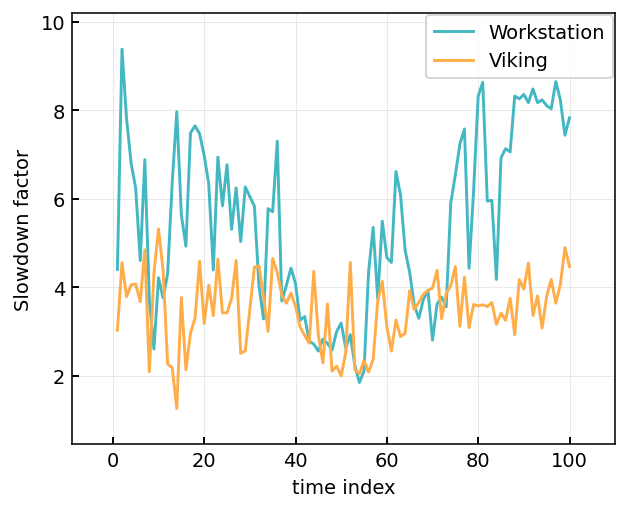

In [72]:
fig, ax = plt.subplots()


ax.plot(df["workstation"], label = "Workstation")
ax.plot(df["viking"], label = "Viking")
ax.set_xlabel("time index")
ax.set_ylabel("Slowdown factor")
ax.legend()

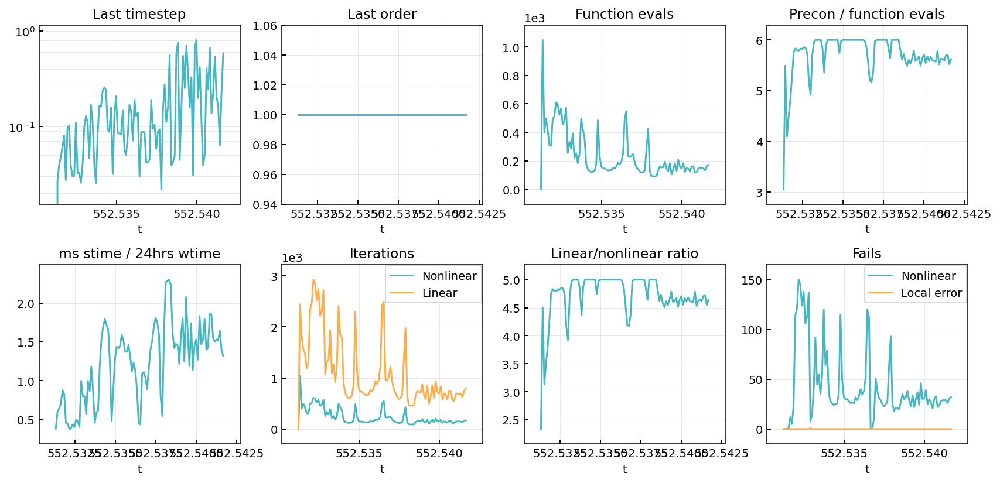

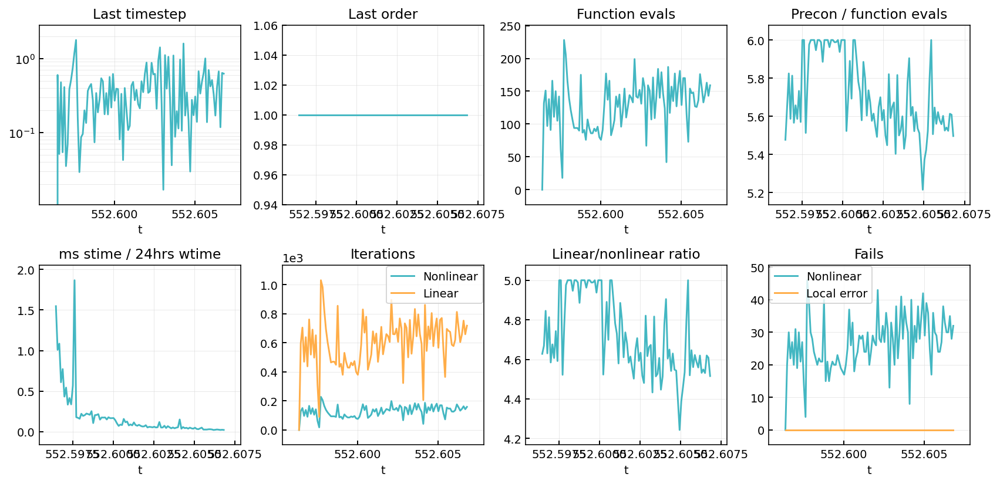

In [5]:
for case in cs:
    plot_cvode_performance(cs[case].ds)

In [13]:
t

array([0.55226293])

# Other

In [5]:
for case in cs:
    cs[case].ds = calculate_radial_fluxes(cs[case].ds)

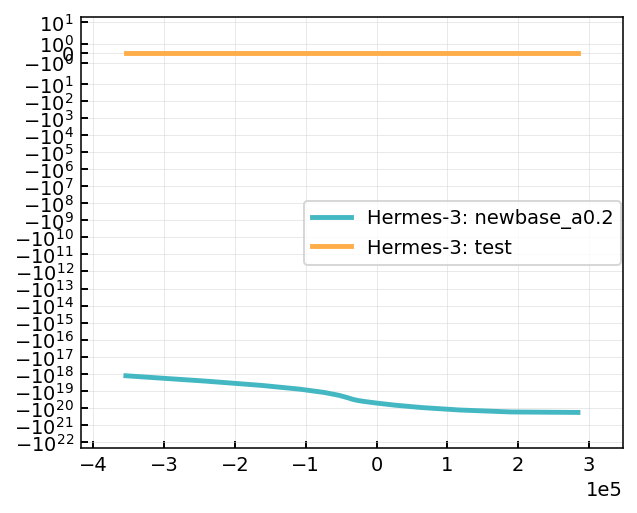

In [20]:
fig, ax = plt.subplots()
kwargs = dict(lw = 2.5)

for case in cs:
# for case in ["fix_eqns", "new_a0.2", "new_a0.6"]:
    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    omp = ds.hermesm.select_region("outer_midplane_a").isel(x=slice(2,-2))
    R = omp["dr"].cumsum()
    dist = (R - R[ds.metadata["ixseps1"]])
    ax.plot(dist*100,  omp["ParticleFlow_d_xlow"] /  (omp["dy"]*omp["dz"]), **kwargs, label = f"Hermes-3: {case}")

ax.legend()
ax.set_yscale("symlog")

# Asymptotic limiter calc

Text(0, 0.5, 'Limited flux')

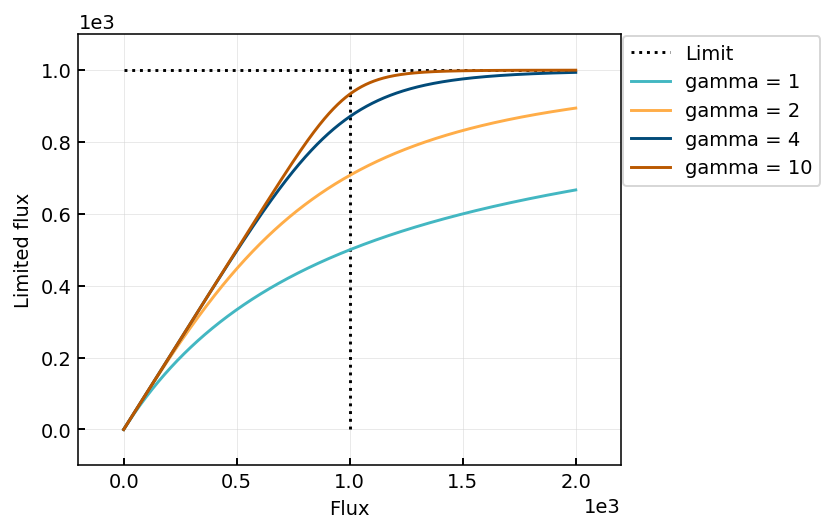

In [39]:
G = np.linspace(0,2000, 5000)
Gmax = 1000
gamma = 1

def make_glim(gamma):
    return G * (1 + (G/Gmax)**gamma)**(-1/gamma)


# plt.hlines(2000, G[0], G[-1], label = "Max", ls = "--", colors = "black")
plt.hlines(Gmax, G[0], G[-1], label = "Limit", ls = ":", colors = "black")
plt.vlines(Gmax, 0, Gmax, ls = ":", colors = "black")

plt.plot(G, make_glim(1), label = "gamma = 1")
plt.plot(G, make_glim(2), label = "gamma = 2")
plt.plot(G, make_glim(5), label = "gamma = 4")
plt.plot(G, make_glim(10), label = "gamma = 10")

plt.xlabel("Flux")
plt.legend(loc = "upper left", bbox_to_anchor=(1,1))
plt.ylabel("Limited flux")

# Time history 2D plots

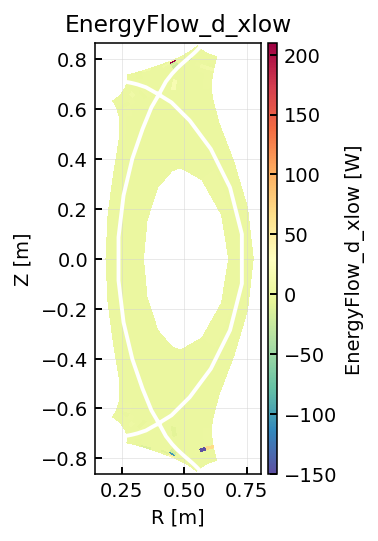

In [10]:
fig, ax = plt.subplots()

ds1 = cs["base"].ds.isel(t=-1)
ds2 = cs["sepcond"].ds.isel(t=-1)

(ds2["EnergyFlow_d_xlow"] / ds1["EnergyFlow_d_xlow"]).bout.polygon(ax = ax, cmap = "Spectral_r")

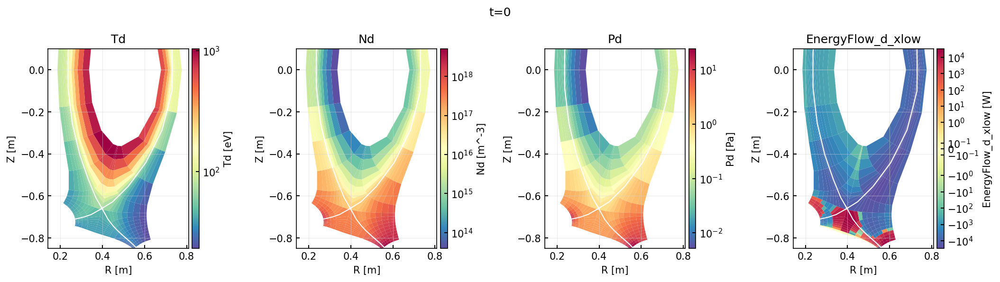

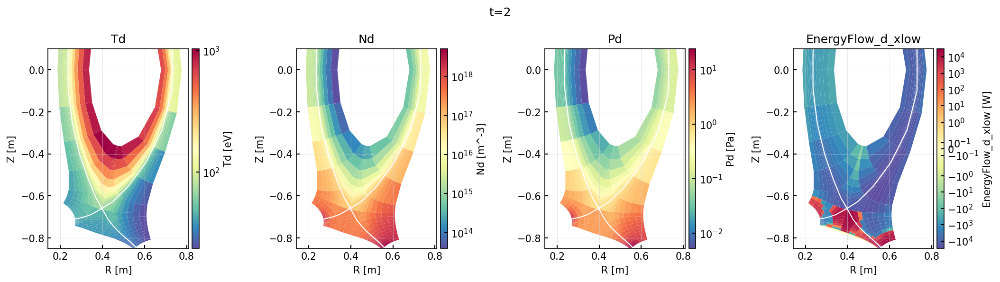

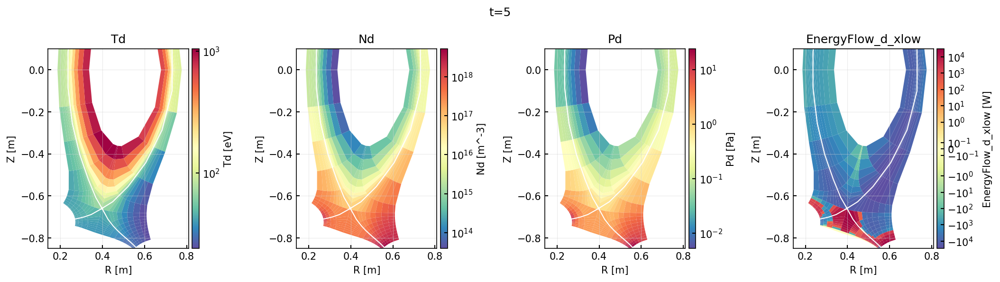

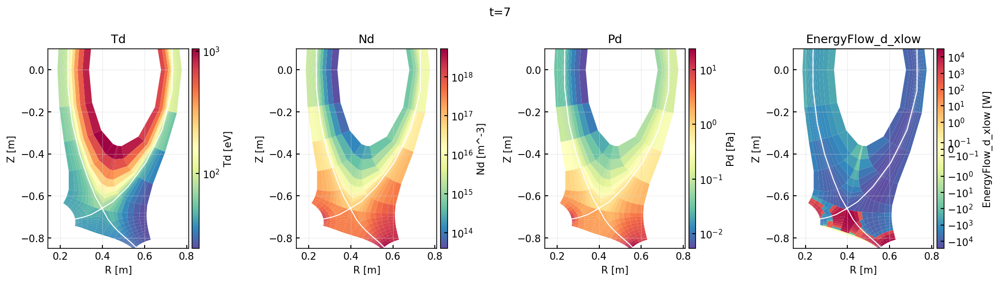

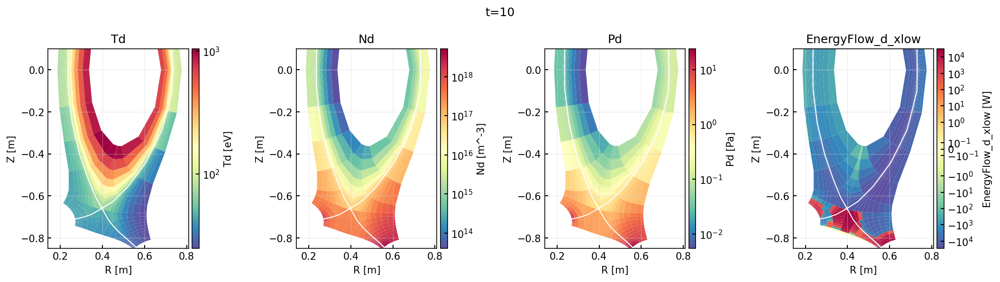

In [9]:
for case in ["sepcond"]:
# for case in ["base", "no_rnn_flim1"]:

    tlen = cs[case].ds.dims["t"]
    for t in np.linspace(0,tlen-1, 5, dtype = int):
        ds = cs[case].ds.isel(t=t)
        plot2d(
            [
                    dict(data = ds["Td"], logscale = True, vmin = None, vmax = None),
                    # dict(data = ds["gradperplogP_d"]),
                    
                    # dict(data = ds["gradlogP_d"], logscale = False),
                    dict(data = ds["Nd"], logscale = True),
                    dict(data = ds["Pd"], logscale = True),
                    dict(data = ds["EnergyFlow_d_xlow"], logscale = True),
                    # dict(data = ds["gradperplogP_d"], logscale = False, title = "Grad_perp(Pd)/Pd"),
                    # dict(data = ds["Dnn_unlimd"], vmin = 1e2, vmax = 1e5, title = "Unlimited Dn"),
                    # dict(data = ds["Dnnd"], vmin = 1e2, vmax = 1e5, logscale = True, title = "Limited Dn"),
                    # dict(data = ds["Dmax_d"], vmin = 1e2, vmax = 1e5, logscale = True, title = "Max Dn"),
                    # dict(data = ds["Dnnd"] / ds["Dnn_unlimd"], logscale = False, vmin = 0, vmax = 1, title = "Limiter factor"),
                ], 
                ylim = (-0.85, 0.1),
                title = f"t={t}")

# Difference in Vth definitions

Text(0.5, 1.0, 'Thermal velocity comparison')

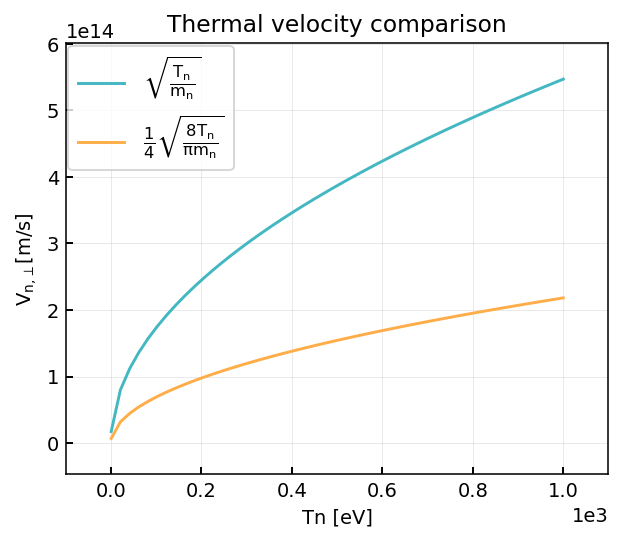

In [24]:
Tn = np.linspace(1,1000, 50)

dn1 = (np.sqrt(Tn / (constants("mass_p")*2)))
dn2 = (0.25 * np.sqrt(8 * Tn / ( (constants("mass_p")*2) *np.pi)))

fig, ax = plt.subplots()
ax.plot(Tn, dn1, label = r"$\sqrt{\frac{T_{n}}{m_n}}}$")
# ax.plot(Tn, dn1, label = r"$\frac{T_n}{m_n}$")
ax.plot(Tn, dn2, label = r"$\frac{1}{4}\sqrt{\frac{8T_{n}}{\pi m_n}}}$")
ax.set_ylabel(r"$V_{n,\perp} [m/s]$")
ax.set_xlabel("Tn [eV]")
# ax.set_yscale("log")
ax.legend(fontsize = "large")
ax.set_title("Thermal velocity comparison")

# Convergence

## Last few timesteps

In [3]:
cs.keys()

dict_keys(['asymp2_noradrec'])

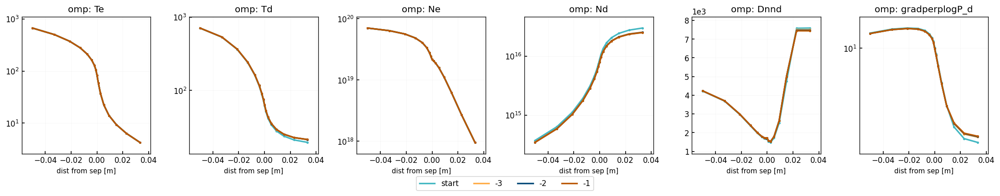

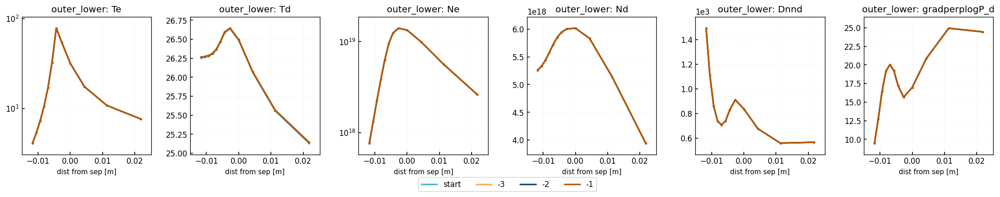

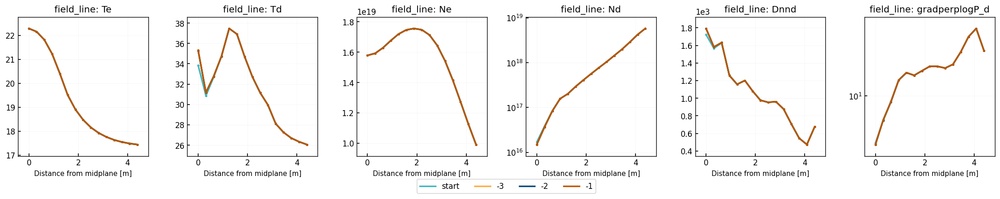

In [4]:
case = "asymp2_noradrec"
lineplot(
    {
        "start":cs[case].ds.isel(t=0, x = slice(2,-2)),
        "-3":cs[case].ds.isel(t=-3, x = slice(2,-2)),
        "-2":cs[case].ds.isel(t=-2, x = slice(2,-2)),
        "-1":cs[case].ds.isel(t=-1, x = slice(2,-2)),
        # "base":cs["base"].ds.isel(t=-1, x = slice(2,-2)),

    },
    clean_guards = False,
    params = ["Te", "Td", "Ne", "Nd", "Dnnd", "gradperplogP_d"],
    regions = ["omp", "outer_lower", "field_line"],
)

## All timesteps

In [ ]:
case = "addc_4x"
tlen = cs[case].ds.dims["t"]
tres = 10
ts = np.linspace(0, tlen-1, tres, dtype = int)
colors = [plt.cm.get_cmap("plasma", tres)(x) for x in range(tres)]

toplot = {}
for t in ts:
    toplot[f"t={t/10}ms"] = cs[case].ds.isel(t=t, x = slice(2,-2))

lineplot(
    toplot,
    clean_guards = False,
    params = ["Te", "Td", "Ne", "Nd", "Pd+", "Pd"],
    regions = ["omp", "outer_lower", "field_line"],
    colors = colors
)

# Compare casestore

In [ ]:
cs.keys()

dict_keys(['base', 'test_legacy', 'test_afn'])

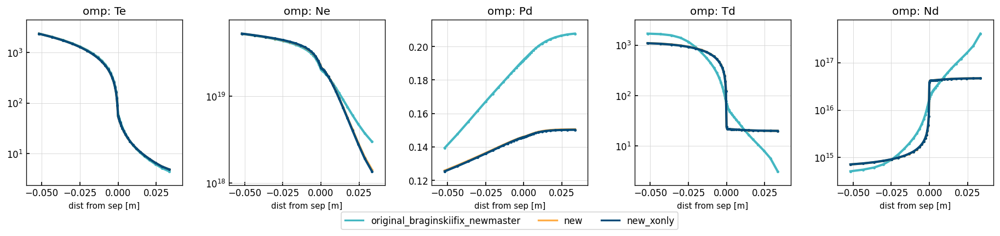

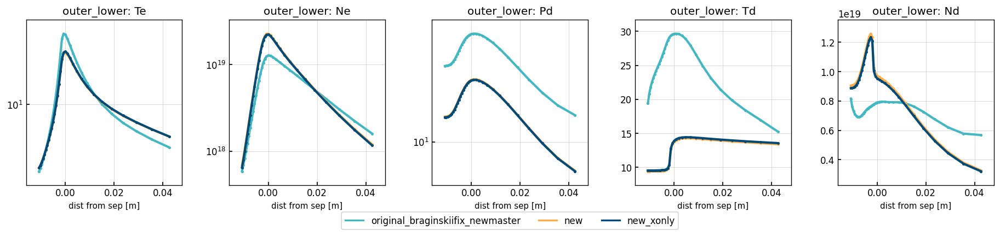

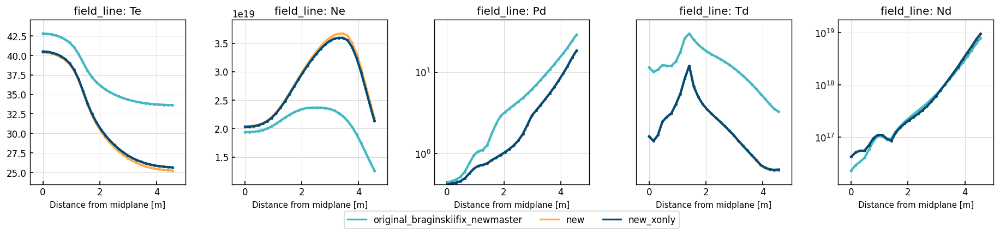

In [10]:
toplot = {}
for case in cs:
# for case in ["test_legacy", "test_afn"]:

    ds = cs[case].ds
    if "t" in ds.dims: ds = ds.isel(t=-1)
    toplot[case] = ds.isel(x = slice(2,-2))
    
lineplot(
    toplot,
    clean_guards = False,
    logscale = True,
    params = ["Te", "Ne", "Pd", "Td", "Nd"],
    # params = ["Nd", "Dnnd"],
    regions = ["omp", "outer_lower", "field_line"],
)